<a href="https://colab.research.google.com/github/aletbm/Prediccion_del_clima_CoderHouse/blob/main/Proyecto_Final_Rios_Alexander_Daniel_CoderHouse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prediccion del clima

<img src="https://wallpapercave.com/wp/wp9772066.jpg">

## Objetivo
Imagina que sales de tu casa listo para disfrutar de un excelente y soleado dia, incluso planeas tener una cita en el parque con alguien, y disfrutar de un helado.
Pero inesperadamente el clima comienza a tornarse ventoso, las primeras nubes comienzan a asomarse lentamente, ves destellos de luz pensando que alguien se saco una foto y saliste en ella despeinado, pero te percatas de que esta por iniciarse una tormenta electrica e incluso al mirar al cielo sientes pequeñas gotas de agua caer sobre ti, si mi amigo, una desafortunada lluvia esta por asomarse amenazando con arruinar todos tus planes, y agarrandote la cabeza recuerdas que hubiera sido buena idea haber visto el pronostico antes de salir de casa, ya que tampoco llevas tu paraguas contigo "¡Que mala suerte 😢!" piensas.

Lo bueno es que tengo buenas noticias para ti, esos dias se podrian acabar! En este notebook desarrollare para ti una herramienta que podria ayudarte a planificar mejor tus actividades, o bueno al menos sabras cuando llevar el paraguas de paseo no? 🤭.

¿Como podemos hacer esto posible?. Bueno siendo sinceros, esto ya se hace desde tiempos inmemorables, de multiples formas el ser humano se ha arreglado para predecir el tiempo, algunos metodos han resultado mas efectivos que otros y no somos quienes para criticar los resultados ya que predecir el clima no es una tarea facil, se deben tener en cuenta cientos de parametros y muchas veces esta tarea, para un solo ser humano, puede ser compleja, por eso es que pondremos a merced de nuestros deseos algunos algoritmos de aprendizaje automatico.

Pero antes, debemos conseguir una fuente fiable de datos y posteriormente analizarla y limpiarla, pero supongamos por un momento que esto ya lo tenemos nos surgen algunas preguntas claves:

>¿Existira algun patron que nos permita identificar un dia posiblemente lluvioso?

>¿Que parametros son vitales para predecir un dia lluvioso? Y de ser asi, ¿Como se relacionan?

>¿Habra una epoca del año en la que haya mayores probabilidades de llover?

## Contexto comercial
El **Servicio Meteorologico Nacional de Argentina (SMNA)** ha recolectado miles de datos meteorologicos a lo largo de 10 años hasta la fecha actual. Nos han contratado para desarrollar y mantener una herramienta que sea capaz de predecir, en tiempo real, el pronostico nacional, con el fin de poner a disposicion de la poblacion el pronostico esperado, y mantenerlos en estado de alerta cuando sea necesario, evitando asi perdidas inesperadas a causa de haber brindado un servicio mas preciso.

## Problema comercial
En base a los datos presentados por el SMNA, se requiere realizar visualizaciones que permitan responder las siguiente preguntas:
>¿Cuales son las probabilidades de precipitaciones?

>¿A que hora es probable que comiencen las precipitaciones?

>¿Habran mas dias de precipitaciones esta semana?

>¿Como afecta la temperatura a las probabilidades de precipitaciones?

>¿Como afecta la presion superficial a las probabilidades de precipitaciones?

## Contexto analítico
El SMNA nos ha proporcionado una API de datos que es capaz de brindarnos los datos meteorologicos recolectados, algunas de las caracteristicas confeccionadas son, por ejemplo, temperaturas a diferentes alturas de la superficie, presion superficial, velocidad del viento sensadas a diferentes alturas de la superficie, entre otras 61 caracteristicas disponibles.
Al ser un un set de datos cronologicamente confeccionado puede considerarse a la fecha de confeccion como el indice interno.
De acuerdo a estos datos, debemos realizar las siguiente tareas:
>Leer y hacer una vista previa del set de datos.

>Detectar y procesar datos faltantes, determinar si pueden ser descartados y en caso contrario rellenarlos.

>Detectar outliers y procesarlos.

>Determinar caracteristicas relevantes.

>Analizar y realizar visualizaciones sobre los datos que nos permita responder aquellas preguntas realizadas y que nos permitan identificar patrones utiles.

## Humano precavido vale por 3 asi que *¡Manos a la obra!* 😊

---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mplcyberpunk missingno calplot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.3/132.3 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for calplot: filename=calplot-0.1.7.5-py3-none-any.whl size=8115 sha256=36c87384045b222d2fb56fb8808941d23e6bf908b54ec167ea1505a00ce2fbab
  Stored in directory: /root/.cache/pip/wheels/77/75/32/a518a4a1421776a93e1ede33cb8dac474095bf31fed7e4e22c
Successfully built calplot


In [3]:
import numpy as np
import json
from datetime import datetime, timedelta
import urllib.request
import pandas as pd
import numpy as np
from pandas import json_normalize
from pprint import pprint as pp

from xgboost import XGBRegressor, DMatrix, train as xgbtrain
from scipy.signal import find_peaks
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

import matplotlib.pyplot as plt
import seaborn as sns
import mplcyberpunk
import missingno as msno

from IPython.display import Javascript
def adjust_display():
  display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 50000})'''))

plt.style.use("cyberpunk")
pd.options.display.max_columns = None

# ¿Donde podemos obtener datos meteorologicos?

<img src="https://pbs.twimg.com/profile_images/1591121427893190664/LtkaUCDu_400x400.jpg">

[Open-Meteo](https://open-meteo.com) es una API meteorológica de código abierto y ofrece acceso gratuito para uso no comercial. La cual no exije uso de API key.

Open-Meteo se asocia con servicios meteorológicos nacionales para brindarle datos abiertos con alta resolución, que van de 1 a 11 kilómetros.

Las API de Open-Meteo están diseñadas para brindarle la información meteorológica más precisa para su ubicación.

## ¿Y como podemos obtener acceso a estos datos?

<img src="https://drive.google.com/uc?export=view&id=1LRIgscx5-WIdozjMn41k-dnIRxbFnUER">

Mediante su [Historical Weather API](https://open-meteo.com/en/docs/historical-weather-api), obtenemos acceso a más de 80 años de datos meteorológicos por hora, que cubren cualquier lugar del planeta, todo con una resolución de 10 kilómetros. Este extenso conjunto de datos nos permite profundizar en el pasado y analizar patrones climáticos históricos.

Allí dentro podemos ajustar algunas opciones sobre los datos que queremos obtener:

<img src="https://drive.google.com/uc?export=view&id=1MmVTDVFHnguINAsgVWfHOtGgOHg8x2MX">

A priori decidi traer toda la informacion historica disponible, luego me encargare de limpiarla y conservar la que considere realmente util.

Una vez que realizamos la configuracion de los datos que queremos traer, se nos habilitara la API url desde la cual podemos obtener los datos con Python, como veremos mas adelante:

<img src="https://drive.google.com/uc?export=view&id=1tGP_uhIs8DqU2pWCFSbjOuUFo-zoac0Z">

A su vez, la plataforma nos brinda una vista previa interactiva de los datos solicitados:

<img src="https://drive.google.com/uc?export=view&id=1dzmhW6rvseCGh-flqYSdiSHrByzGf6kE">

Podemos consultar la documentacion de la API desde [aqui](https://open-meteo.com/en/docs/historical-weather-api#api-documentation).

## Definición de parámetros horarios
<table>
<tr><th>Variable</th><th>Valid time</th><th>Unit</th><th>Description</th></tr>
<tr><td>temperature_2m</td><td>Instant</td><td>°C (°F)</td><td>Air temperature at 2 meters above ground</td></tr>
<tr><td>relativehumidity_2m</td><td>Instant</td><td>%</td><td>Relative humidity at 2 meters above ground</td></tr>
<tr><td>dewpoint_2m</td><td>Instant</td><td>°C (°F)</td><td>Dew point temperature at 2 meters above ground</td></tr>
<tr><td>apparent_temperature</td><td>Instant</td><td>°C (°F)</td><td>Apparent temperature is the perceived feels-like temperature combining wind chill factor, relative humidity and solar radiation</td></tr>
<tr><td>pressure_msl<br>
surface_pressure</td><td>Instant</td><td>hPa</td><td>Atmospheric air pressure reduced to mean sea level (msl) or pressure at surface. Typically pressure on mean sea level is used in meteorology. Surface pressure gets lower with increasing elevation.</td></tr>
<tr><td>precipitation</td><td>Preceding hour sum</td><td>mm (inch)</td><td>Total precipitation (rain, showers, snow) sum of the preceding hour. Data is stored with a 0.1 mm precision. If precipitation data is summed up to monthly sums, there might be small inconsistencies with the total precipitation amount.</td></tr>
<tr><td>rain</td><td>Preceding hour sum</td><td>mm (inch)</td><td>Only liquid precipitation of the preceding hour including local showers and rain from large scale systems.</td></tr>
<tr><td>snowfall</td><td>Preceding hour sum</td><td>cm (inch)</td><td>Snowfall amount of the preceding hour in centimeters. For the water equivalent in millimeter, divide by 7. E.g. 7 cm snow = 10 mm precipitation water equivalent</td></tr>
<tr><td>cloudcover</td><td>Instant</td><td>%</td><td>Total cloud cover as an area fraction</td></tr>
<tr><td>cloudcover_low</td><td>Instant</td><td>%</td><td>Low level clouds and fog up to 2 km altitude</td></tr>
<tr><td>cloudcover_mid</td><td>Instant</td><td>%</td><td>Mid level clouds from 2 to 6 km altitude</td></tr>
<tr><td>cloudcover_high</td><td>Instant</td><td>%</td><td>High level clouds from 6 km altitude</td></tr>
<tr><td>shortwave_radiation</td><td>Preceding hour mean</td><td>W/m²</td><td>Shortwave solar radiation as average of the preceding hour. This is equal to the total global horizontal irradiation</td></tr>
<tr><td>direct_radiation<br>
direct_normal_irradiance</td><td>Preceding hour mean</td><td>W/m²</td><td>Direct solar radiation as average of the preceding hour on the horizontal plane and the normal plane (perpendicular to the sun)</td></tr>
<tr><td>diffuse_radiation</td><td>Preceding hour mean</td><td>W/m²</td><td>Diffuse solar radiation as average of the preceding hour</td></tr>
<tr><td>windspeed_10m<br>
windspeed_100m</td><td>Instant</td><td>km/h (mph, m/s, knots)</td><td>Wind speed at 10 or 100 meters above ground. Wind speed on 10 meters is the standard level.</td></tr>
<tr><td>winddirection_10m<br>
winddirection_100m</td><td>Instant</td><td>°</td><td>Wind direction at 10 or 100 meters above ground</td></tr>
<tr><td>windgusts_10m</td><td>Preceding hour max</td><td>km/h (mph, m/s, knots)</td><td>Gusts at 10 meters above ground of the indicated hour. Wind gusts in CERRA are defined as the maximum wind gusts of the preceding hour. Please consult the ECMWF IFS documentation for more information on how wind gusts are parameterized in weather models.</td></tr>
<tr><td>et0_fao_evapotranspiration</td><td>Preceding hour sum</td><td>mm (inch)</td><td>ET₀ Reference Evapotranspiration of a well watered grass field. Based on FAO-56 Penman-Monteith equations ET₀ is calculated from temperature, wind speed, humidity and solar radiation. Unlimited soil water is assumed. ET₀ is commonly used to estimate the required irrigation for plants.</td></tr>
<tr><td>weathercode</td><td>Instant</td><td>WMO code</td><td>Weather condition as a numeric code. Follow WMO weather interpretation codes. See table below for details.</td></tr>
<tr><td>snow_depth</td><td>Instant</td><td>meters</td><td>Snow depth on the ground. Snow depth in ERA5-Land tends to be overestimated. As the spatial resolution for snow depth is limited, please use it with care.</td></tr>
<tr><td>vapor_pressure_deficit</td><td>Instant</td><td>kPa</td><td>Vapor Pressure Deficit (VPD) in kilopascal (kPa). For high VPD (>1.6), water transpiration of plants increases. For low VPD (<0.4), transpiration decreases</td></tr>
<tr><td>soil_temperature_0_to_7cm<br>
soil_temperature_7_to_28cm<br>
soil_temperature_28_to_100cm<br>
soil_temperature_100_to_255cm</td><td>Instant</td><td>°C (°F)</td><td>Average temperature of different soil levels below ground.</td></tr>
<tr><td>soil_moisture_0_to_7cm<br>
soil_moisture_7_to_28cm<br>
soil_moisture_28_to_100cm<br>
soil_moisture_100_to_255cm</td><td>Instant</td><td>m³/m³</td><td>Average soil water content as volumetric mixing ratio at 0-7, 7-28, 28-100 and 100-255 cm depths.</td></tr>
</table>

## Definición de parámetros diarios
<table>
<tr><th>Variable</th><th>Unit</th><th>Description</th></tr>
<tr><td>weathercode</td><td>WMO code</td><td>The most severe weather condition on a given day</td></tr>
<tr><td>temperature_2m_max<br>
temperature_2m_min</td><td>°C (°F)</td><td>Maximum and minimum daily air temperature at 2 meters above ground</td></tr>
<tr><td>apparent_temperature_max<br>
apparent_temperature_min</td><td>°C (°F)</td><td>Maximum and minimum daily apparent temperature</td></tr>
<tr><td>precipitation_sum</td><td>mm</td><td>Sum of daily precipitation (including rain, showers and snowfall)</td></tr>
<tr><td>rain_sum</td><td>mm</td><td>Sum of daily rain</td></tr>
<tr><td>snowfall_sum</td><td>cm</td><td>Sum of daily snowfall</td></tr>
<tr><td>precipitation_hours</td><td>hours</td><td>The number of hours with rain</td></tr>
<tr><td>sunrise<br>
sunset</td><td>iso8601</td><td>Sun rise and set times</td></tr>
<tr><td>windspeed_10m_max<br>
windgusts_10m_max</td><td>km/h (mph, m/s, knots)</td><td>Maximum wind speed and gusts on a day</td></tr>
<tr><td>winddirection_10m_dominant</td><td>°</td><td>Dominant wind direction</td></tr>
<tr><td>shortwave_radiation_sum</td><td>MJ/m²</td><td>The sum of solar radiation on a given day in Megajoules</td></tr>
<tr><td>et0_fao_evapotranspiration</td><td>mm</td><td>Daily sum of ET₀ Reference Evapotranspiration of a well watered grass field</td></tr>
</table>

# Obtencion de datos

In [4]:
#Datos de Argentina
latitud = "-34"
longitud = "-64"

start_date = "2000-01-01"
end_date = str((datetime.today() - timedelta(days=1)).date())

actualizar_datos = True

weather_url = f"""
          https://archive-api.open-meteo.com/v1/archive?
          latitude={latitud}
          &longitude={longitud}
          &start_date={start_date}
          &end_date={end_date}
          &hourly=temperature_2m,
            relativehumidity_2m,
            dewpoint_2m,
            apparent_temperature,
            precipitation,
            rain,snowfall,
            weathercode,
            pressure_msl,
            surface_pressure,
            cloudcover,
            cloudcover_low,
            cloudcover_mid,
            cloudcover_high,
            et0_fao_evapotranspiration,
            vapor_pressure_deficit,
            windspeed_10m,
            windspeed_100m,
            winddirection_10m,
            winddirection_100m,
            windgusts_10m,
            soil_temperature_0_to_7cm,
            soil_temperature_7_to_28cm,
            soil_temperature_28_to_100cm,
            soil_temperature_100_to_255cm,
            soil_moisture_0_to_7cm,
            soil_moisture_7_to_28cm,
            soil_moisture_28_to_100cm,
            soil_moisture_100_to_255cm,
            is_day,
            shortwave_radiation,
            direct_radiation,
            diffuse_radiation,
            direct_normal_irradiance,
            terrestrial_radiation,
            shortwave_radiation_instant,
            direct_radiation_instant,
            diffuse_radiation_instant,
            direct_normal_irradiance_instant,
            terrestrial_radiation_instant
          &daily=weathercode,
            temperature_2m_max,
            temperature_2m_min,
            temperature_2m_mean,
            apparent_temperature_max,
            apparent_temperature_min,
            apparent_temperature_mean,
            sunrise,sunset,
            precipitation_sum,
            rain_sum,snowfall_sum,
            precipitation_hours,
            windspeed_10m_max,
            windgusts_10m_max,
            winddirection_10m_dominant,
            shortwave_radiation_sum,
            et0_fao_evapotranspiration
          &timezone=America%2FSao_Paulo
          """
weather_url = weather_url.replace("\n", "").replace(" ", "")

if actualizar_datos == True:
  with urllib.request.urlopen(weather_url) as weather:
    weather=json.loads(weather.read().decode())
    df_weather = pd.DataFrame(weather["daily"])
    df_aux = pd.DataFrame(weather["hourly"])
else:
  df_weather = pd.read_csv("/content/drive/MyDrive/Coder/Data Science/Desafio APIS/weather.csv")
  df_aux = pd.read_csv("/content/drive/MyDrive/Coder/Data Science/Desafio APIS/weather_hourly.csv")

df_weather.head()

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration
0,2000-01-01,1.0,30.5,20.9,25.8,32.0,21.2,26.5,2000-01-01T06:08,2000-01-01T20:30,0.0,0.0,0.0,0.0,16.9,39.2,20.0,27.40,6.58
1,2000-01-02,2.0,31.2,20.8,25.9,32.5,21.0,25.9,2000-01-02T06:08,2000-01-02T20:30,0.0,0.0,0.0,0.0,15.2,34.9,43.0,30.41,7.47
2,2000-01-03,2.0,30.2,19.5,24.8,31.9,18.8,25.2,2000-01-03T06:09,2000-01-03T20:30,0.0,0.0,0.0,0.0,12.0,31.3,49.0,30.39,6.83
3,2000-01-04,51.0,28.2,20.0,23.9,32.9,22.1,26.3,2000-01-04T06:10,2000-01-04T20:30,0.9,0.9,0.0,5.0,10.2,27.4,310.0,24.66,5.02
4,2000-01-05,1.0,31.0,18.5,25.4,35.2,20.4,28.1,2000-01-05T06:11,2000-01-05T20:31,0.0,0.0,0.0,0.0,8.6,24.1,157.0,29.86,6.22


In [5]:
df_weather.shape, df_aux.shape

((8795, 19), (211080, 41))

In [6]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   time                        8795 non-null   object 
 1   weathercode                 8794 non-null   float64
 2   temperature_2m_max          8794 non-null   float64
 3   temperature_2m_min          8794 non-null   float64
 4   temperature_2m_mean         8793 non-null   float64
 5   apparent_temperature_max    8794 non-null   float64
 6   apparent_temperature_min    8794 non-null   float64
 7   apparent_temperature_mean   8793 non-null   float64
 8   sunrise                     8795 non-null   object 
 9   sunset                      8795 non-null   object 
 10  precipitation_sum           8793 non-null   float64
 11  rain_sum                    8793 non-null   float64
 12  snowfall_sum                8793 non-null   float64
 13  precipitation_hours         8795 

In [7]:
df_aux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211080 entries, 0 to 211079
Data columns (total 41 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   time                              211080 non-null  object 
 1   temperature_2m                    211053 non-null  float64
 2   relativehumidity_2m               211053 non-null  float64
 3   dewpoint_2m                       211053 non-null  float64
 4   apparent_temperature              211053 non-null  float64
 5   precipitation                     211053 non-null  float64
 6   rain                              211053 non-null  float64
 7   snowfall                          211053 non-null  float64
 8   weathercode                       211053 non-null  float64
 9   pressure_msl                      211053 non-null  float64
 10  surface_pressure                  211053 non-null  float64
 11  cloudcover                        211053 non-null  f

In [8]:
df_weather.describe()

,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration
count,8794.000000,8794.000000,8794.000000,8793.000000,8794.000000,8794.000000,8793.000000,8793.000000,8793.000000,8793.000000,8795.000000,8794.000000,8794.00000,8793.000000,8793.000000,8793.000000
mean,19.678303,23.218683,13.293757,17.955362,22.827053,11.859654,16.923780,2.031514,2.030217,0.000923,2.042069,16.833511,35.57098,103.588081,17.926385,3.927765
std,26.145915,6.604681,5.918864,6.110164,8.570002,7.453739,7.736397,6.231221,6.230963,0.054953,4.104287,4.887476,10.30956,87.477898,8.239629,2.115756
min,0.000000,2.400000,-9.600000,-1.900000,-0.800000,-14.500000,-6.200000,0.000000,0.000000,0.000000,0.000000,5.200000,12.60000,0.000000,0.860000,0.200000
25%,1.000000,18.100000,8.600000,12.900000,16.000000,5.800000,10.500000,0.000000,0.000000,0.000000,0.000000,13.200000,28.10000,33.000000,11.500000,2.130000
50%,2.000000,23.400000,13.500000,18.200000,22.900000,11.800000,17.000000,0.000000,0.000000,0.000000,0.000000,16.400000,34.90000,65.000000,17.060000,3.600000
75%,51.000000,28.400000,18.100000,22.900000,29.600000,17.900000,23.200000,0.500000,0.500000,0.000000,2.000000,19.900000,42.10000,166.000000,24.830000,5.580000
max,73.000000,41.400000,28.500000,34.400000,43.600000,30.700000,34.700000,90.500000,90.500000,3.920000,24.000000,42.900000,90.40000,360.000000,34.610000,11.640000


In [9]:
df_aux.describe()

,temperature_2m,relativehumidity_2m,dewpoint_2m,apparent_temperature,precipitation,rain,snowfall,weathercode,pressure_msl,surface_pressure,cloudcover,cloudcover_low,cloudcover_mid,cloudcover_high,et0_fao_evapotranspiration,vapor_pressure_deficit,windspeed_10m,windspeed_100m,winddirection_10m,winddirection_100m,windgusts_10m,soil_temperature_0_to_7cm,soil_temperature_7_to_28cm,soil_temperature_28_to_100cm,soil_temperature_100_to_255cm,soil_moisture_0_to_7cm,soil_moisture_7_to_28cm,soil_moisture_28_to_100cm,soil_moisture_100_to_255cm,is_day,shortwave_radiation,direct_radiation,diffuse_radiation,direct_normal_irradiance,terrestrial_radiation,shortwave_radiation_instant,direct_radiation_instant,diffuse_radiation_instant,direct_normal_irradiance_instant,terrestrial_radiation_instant
count,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211053.000000,211080.000000,211053.000000,211053.000000,211053.000000,211053.000000,211080.000000,211053.000000,211053.000000,211053.000000,211053.000000,211080.000000
mean,17.943395,64.064372,10.232814,16.924906,0.084638,0.084584,0.000038,5.216529,1014.523666,997.071778,27.886019,15.444050,15.662417,25.817998,0.163643,0.890177,11.456800,20.095074,113.538230,111.110143,24.300864,18.621945,18.604352,18.579649,18.547535,0.283112,0.288279,0.273176,0.264949,0.504415,207.498737,153.463078,54.035659,258.270060,355.034184,206.677099,152.925796,53.751282,256.081804,353.880555
std,7.076152,19.397787,6.502015,8.682501,0.533304,0.533287,0.003218,15.015730,6.626224,6.247010,34.242046,32.132827,28.266977,35.685907,0.199739,0.774140,5.025926,8.321036,95.395733,96.350065,10.390288,6.854233,5.717895,4.541902,3.325812,0.067884,0.058317,0.052405,0.045834,0.499982,293.388667,245.651913,75.431070,343.552452,442.895665,294.601969,246.532739,75.725807,344.463924,445.536193
min,-9.600000,11.000000,-14.200000,-14.500000,0.000000,0.000000,0.000000,0.000000,988.300000,971.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.100000,-1.800000,3.100000,8.900000,11.800000,0.125000,0.160000,0.171000,0.194000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12.700000,49.000000,5.600000,10.200000,0.000000,0.000000,0.000000,0.000000,1010.000000,992.800000,0.000000,0.000000,0.000000,0.000000,0.020000,0.320000,7.600000,14.100000,34.000000,31.000000,16.200000,13.300000,13.700000,14.500000,15.500000,0.232000,0.243000,0.230000,0.223000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,17.900000,65.000000,10.600000,16.700000,0.000000,0.000000,0.000000,0.000000,1014.100000,996.700000,13.000000,0.000000,0.000000,2.000000,0.070000,0.670000,10.900000,20.200000,74.000000,72.000000,23.000000,18.700000,18.800000,18.600000,18.600000,0.287000,0.290000,0.277000,0.261000,1.000000,8.000000,1.000000,6.000000,2.200000,57.600000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,23.000000,80.000000,15.300000,23.400000,0.000000,0.000000,0.000000,1.000000,1018.700000,1001.000000,43.000000,6.000000,17.000000,49.000000,0.250000,1.230000,14.800000,26.000000,182.000000,178.000000,31.000000,23.700000,23.500000,22.800000,21.700000,0.334000,0.332000,0.311000,0.294000,1.000000,382.000000,245.000000,92.000000,572.800000,709.600000,378.700000,242.200000,93.200000,572.500000,711.700000
max,41.400000,100.000000,26.600000,43.600000,26.000000,26.000000,0.420000,73.000000,1043.300000,1024.500000,100.000000,100.000000,100.000000,100.000000,1.040000,6.700000,42.900000,68.200000,360.000000,360.000000,90.400000,42.100000,33.900000,28.400000,24.100000,0.442000,0.439000,0.422000,0.368000,1.0

## Visualizando nuestro objetivo

Text(0, 0.5, 'Precipitation')

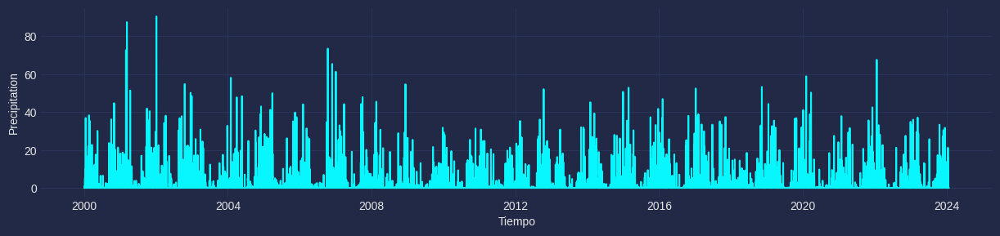

In [10]:
plt.figure(figsize=(15,3))
sns.lineplot(x=pd.to_datetime(df_weather.time), y=df_weather.precipitation_sum);
plt.xlabel("Tiempo")
plt.ylabel("Precipitation")

## Guardando datos

In [11]:
if actualizar_datos == True:
  df_weather.to_csv("/content/drive/MyDrive/Coder/Data Science/Desafio APIS/weather.csv", index=False)
  df_aux.to_csv("/content/drive/MyDrive/Coder/Data Science/Desafio APIS/weather_hourly.csv", index=False)

## Previsualizacion de algunos datos

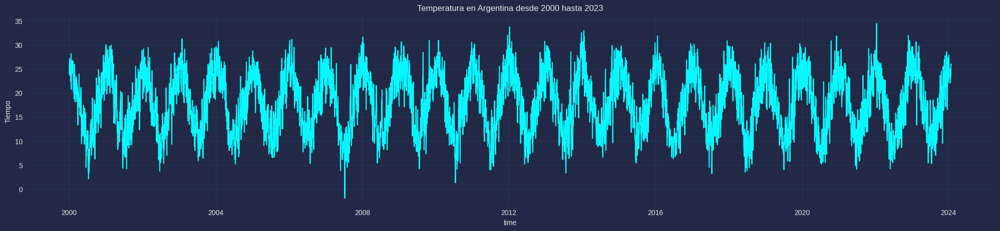

In [12]:
df_weather["time"] = pd.to_datetime(df_weather["time"])

plt.figure(figsize=(25, 5))
sns.lineplot(data=df_weather, x="time", y="temperature_2m_mean")
plt.ylabel("Temperatura")
plt.ylabel("Tiempo")
plt.title("Temperatura en Argentina desde 2000 hasta 2023");

# Data wrangling

## Tratando los datos faltantes

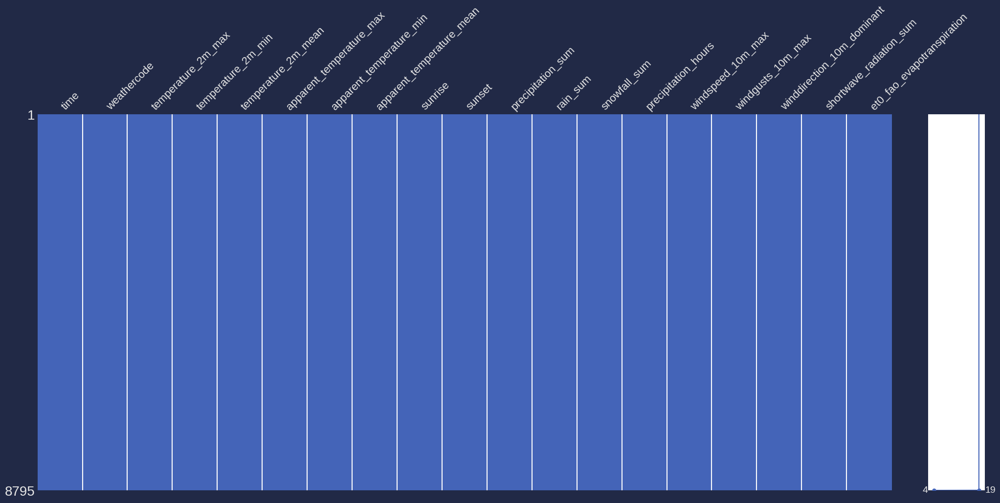

In [13]:
msno.matrix(df_weather, color=(68/255, 100/255, 184/255));

Se puede ver que hay un rango de fechas que contienen datos faltantes, veamos cual es el rango.

In [14]:
fecha_faltante_max = df_weather[df_weather.isna().any(axis=1)]["time"].max()
fecha_faltante_min = df_weather[df_weather.isna().any(axis=1)]["time"].min()

print("Faltan datos desde el", fecha_faltante_min, "hasta el", fecha_faltante_max)

print(f"Falta datos de los ultimos {str(fecha_faltante_max - fecha_faltante_min)}")

Faltan datos desde el 2024-01-28 00:00:00 hasta el 2024-01-29 00:00:00
Falta datos de los ultimos 1 days 00:00:00


Podemos observar tambien que la mayoria de columnas en este rango de fechas tienen datos faltantes, teniendo esto en cuenta lo mejor sera eliminar estos registros.

In [15]:
index_faltantes = df_weather[(df_weather["time"] >= fecha_faltante_min) & (df_weather["time"] <= fecha_faltante_max)].index
df_weather.drop(index_faltantes, axis=0, inplace=True)

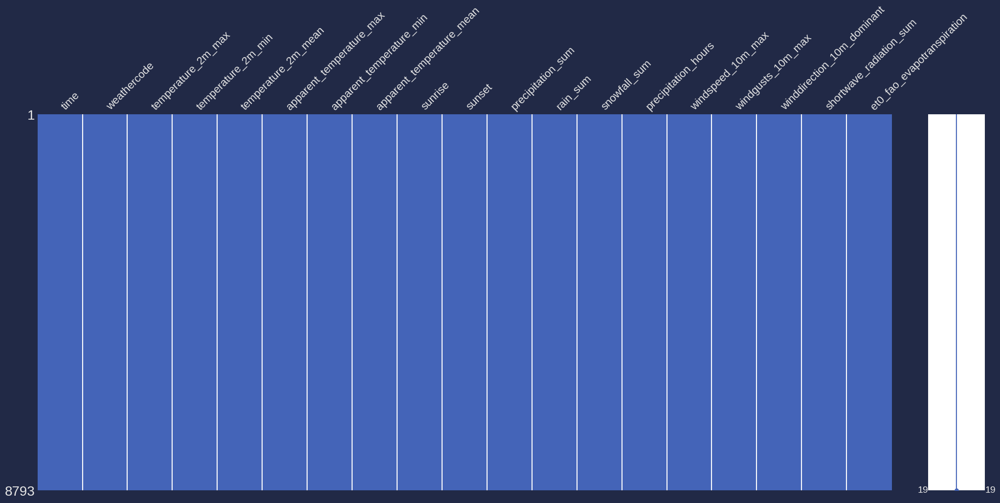

In [16]:
msno.matrix(df_weather, color=(68/255, 100/255, 184/255));

## Buscando datos duplicados

Al ser datos con una secuencia temporal seria raro encontrar datos duplicados, pero siempre es bueno verificar esto.

In [17]:
df_weather.duplicated().sum()

0

Como sospeche, no hay datos duplicados.

# Feature engineering

## Fecha
Una peculiaridad que podemos ver en este set de datos final es que la mayoria de datos, por no decir todas, son caracteristicas numericas, exceptuando las fechas. Trabajemos un poco sobre ellas.

In [18]:
df = df_weather.copy()

df["date"] = df["time"].dt.date
df["hour"] = df["time"].dt.hour

df["date"] = pd.to_datetime(df["date"])

df["day"] = df.date.dt.day
df["month"] = df.date.dt.month
df["year"] = df.date.dt.year
df["week"] = df.date.dt.isocalendar().week.astype('int32')
df["quarter"] = df.date.dt.quarter
df["day_of_year"] = df.date.dt.day_of_year
df["day_of_week"] = df.date.dt.day_of_week

df[["date", "day", "month", "year", "week", "quarter", "day_of_year", "day_of_week"]]

,date,day,month,year,week,quarter,day_of_year,day_of_week
0,2000-01-01,1,1,2000,52,1,1,5
1,2000-01-02,2,1,2000,52,1,2,6
2,2000-01-03,3,1,2000,1,1,3,0
3,2000-01-04,4,1,2000,1,1,4,1
4,2000-01-05,5,1,2000,1,1,5,2
...,...,...,...,...,...,...,...,...
8788,2024-01-23,23,1,2024,4,1,23,1
8789,2024-01-24,24,1,2024,4,1,24,2
8790,2024-01-25,25,1,2024,4,1,25,3
8791,2024-01-26,26,1,2024,4,1,26,4


## Codificacion ciclica

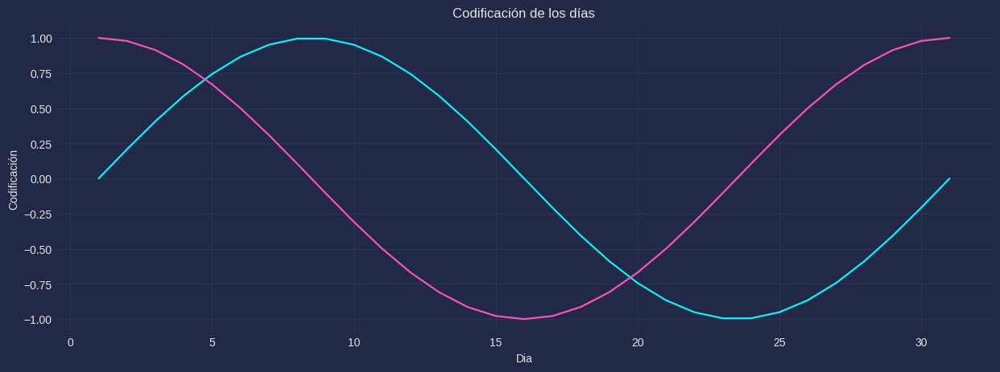

In [19]:
plt.figure(figsize=(15, 5))
x = np.sin((df.day-1)*(2.*np.pi/(df.day.max()-1)))
y = np.cos((df.day-1)*(2.*np.pi/(df.day.max()-1)))
sns.lineplot(x=df.day, y=x)
sns.lineplot(x=df.day, y=y)
plt.xlabel("Dia")
plt.ylabel("Codificación")
plt.title("Codificación de los días");

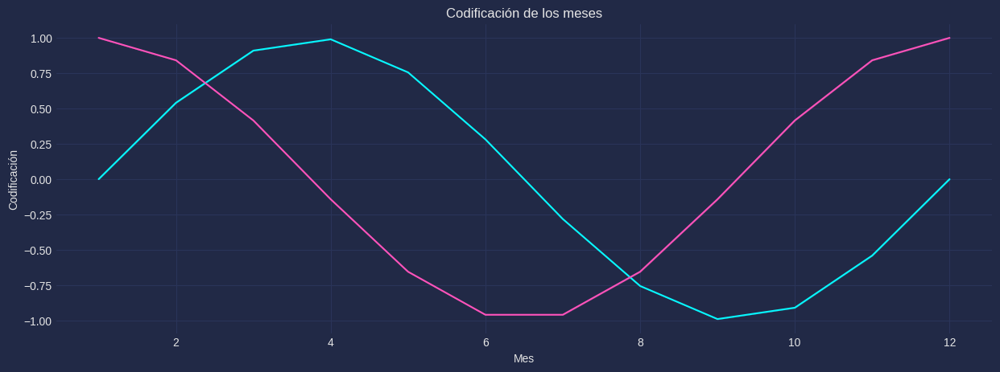

In [20]:
plt.figure(figsize=(15, 5))
x = np.sin((df.month-1)*(2.*np.pi/(df.month.max()-1)))
y = np.cos((df.month-1)*(2.*np.pi/(df.month.max()-1)))
sns.lineplot(x=df.month, y=x)
sns.lineplot(x=df.month, y=y)
plt.xlabel("Mes")
plt.ylabel("Codificación")
plt.title("Codificación de los meses");

In [21]:
for feature in ["day", "month", "week", "quarter", "day_of_year", "day_of_week"]:
    offset = 1
    if feature == "day_of_week":
        offset = 0
    df[feature+"_sin"] = np.sin((df[feature]-offset)*(2.*np.pi/(df[feature].max()-offset)))
    df[feature+"_cos"] = np.cos((df[feature]-offset)*(2.*np.pi/(df[feature].max()-offset)))
df[["day_sin", "day_cos", "month_sin", "month_cos", "week_sin", "week_cos", "quarter_sin", "quarter_cos", "day_of_year_sin", "day_of_year_cos", "day_of_week_sin", "day_of_week_cos"]]

,day_sin,day_cos,month_sin,month_cos,week_sin,week_cos,quarter_sin,quarter_cos,day_of_year_sin,day_of_year_cos,day_of_week_sin,day_of_week_cos
0,0.000000,1.000000,0.0,1.0,-0.120537,0.992709,0.0,1.0,0.000000,1.000000,-8.660254e-01,0.5
1,0.207912,0.978148,0.0,1.0,-0.120537,0.992709,0.0,1.0,0.017213,0.999852,-2.449294e-16,1.0
2,0.406737,0.913545,0.0,1.0,0.000000,1.000000,0.0,1.0,0.034422,0.999407,0.000000e+00,1.0
3,0.587785,0.809017,0.0,1.0,0.000000,1.000000,0.0,1.0,0.051620,0.998667,8.660254e-01,0.5
4,0.743145,0.669131,0.0,1.0,0.000000,1.000000,0.0,1.0,0.068802,0.997630,8.660254e-01,-0.5
...,...,...,...,...,...,...,...,...,...,...,...,...
8788,-0.994522,-0.104528,0.0,1.0,0.354605,0.935016,0.0,1.0,0.369725,0.929141,8.660254e-01,0.5
8789,-0.994522,0.104528,0.0,1.0,0.354605,0.935016,0.0,1.0,0.385663,0.922640,8.660254e-01,-0.5
8790,-0.951057,0.309017,0.0,1.0,0.354605,0.935016,0.0,1.0,0.401488,0.915864,1.224647e-16,-1.0
8791,-0.866025,0.500000,0.0,1.0,0.354605,0.935016,0.0,1.0,0.417194,0.908818,-8.660254e-01,-0.5


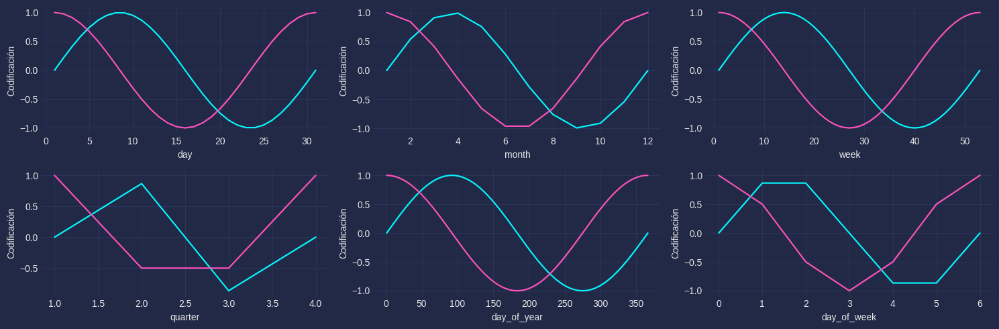

In [22]:
fig, axs = plt.subplots(2, 3, figsize=(15, 5))

for i, feature in enumerate(["day", "month", "week", "quarter", "day_of_year", "day_of_week"]):
    plt.subplot(2, 3, i+1)
    sns.lineplot(x=df[feature], y=df[feature+"_sin"] )
    sns.lineplot(x=df[feature], y=df[feature+"_cos"])
    plt.xlabel(feature)
    plt.ylabel("Codificación")

plt.tight_layout()

In [23]:
df["sunset"] = pd.to_datetime(df["sunset"])
df["sunrise"] = pd.to_datetime(df["sunrise"])

df["sunrise_hour"] = df.sunrise.dt.hour
df["sunrise_minute"] = df.sunrise.dt.minute

df["sunset_hour"] = df.sunset.dt.hour
df["sunset_minute"] = df.sunset.dt.minute

df[["sunset", "sunset_hour", "sunset_minute", "sunrise", "sunrise_hour", "sunrise_minute"]]

,sunset,sunset_hour,sunset_minute,sunrise,sunrise_hour,sunrise_minute
0,2000-01-01 20:30:00,20,30,2000-01-01 06:08:00,6,8
1,2000-01-02 20:30:00,20,30,2000-01-02 06:08:00,6,8
2,2000-01-03 20:30:00,20,30,2000-01-03 06:09:00,6,9
3,2000-01-04 20:30:00,20,30,2000-01-04 06:10:00,6,10
4,2000-01-05 20:31:00,20,31,2000-01-05 06:11:00,6,11
...,...,...,...,...,...,...
8788,2024-01-23 20:27:00,20,27,2024-01-23 06:28:00,6,28
8789,2024-01-24 20:26:00,20,26,2024-01-24 06:29:00,6,29
8790,2024-01-25 20:26:00,20,26,2024-01-25 06:30:00,6,30
8791,2024-01-26 20:25:00,20,25,2024-01-26 06:31:00,6,31


In [24]:
for feature in ["sunset", "sunrise"]:
    df[feature+"_hour_sin"] = np.sin(df[feature+"_hour"]*(2.*np.pi/24))
    df[feature+"_hour_cos"] = np.cos(df[feature+"_hour"]*(2.*np.pi/24))
    df[feature+"_minute_sin"] = np.sin(df[feature+"_minute"]*(2.*np.pi/60))
    df[feature+"_minute_cos"] = np.cos(df[feature+"_minute"]*(2.*np.pi/60))
df[["sunset_hour_sin","sunset_hour_cos","sunset_minute_sin","sunset_minute_cos","sunrise_hour_sin","sunrise_hour_cos","sunrise_minute_sin","sunrise_minute_cos"]]

,sunset_hour_sin,sunset_hour_cos,sunset_minute_sin,sunset_minute_cos,sunrise_hour_sin,sunrise_hour_cos,sunrise_minute_sin,sunrise_minute_cos
0,-0.866025,0.5,1.224647e-16,-1.000000,1.0,6.123234e-17,7.431448e-01,0.669131
1,-0.866025,0.5,1.224647e-16,-1.000000,1.0,6.123234e-17,7.431448e-01,0.669131
2,-0.866025,0.5,1.224647e-16,-1.000000,1.0,6.123234e-17,8.090170e-01,0.587785
3,-0.866025,0.5,1.224647e-16,-1.000000,1.0,6.123234e-17,8.660254e-01,0.500000
4,-0.866025,0.5,-1.045285e-01,-0.994522,1.0,6.123234e-17,9.135455e-01,0.406737
...,...,...,...,...,...,...,...,...
8788,-0.866025,0.5,3.090170e-01,-0.951057,1.0,6.123234e-17,2.079117e-01,-0.978148
8789,-0.866025,0.5,4.067366e-01,-0.913545,1.0,6.123234e-17,1.045285e-01,-0.994522
8790,-0.866025,0.5,4.067366e-01,-0.913545,1.0,6.123234e-17,1.224647e-16,-1.000000
8791,-0.866025,0.5,5.000000e-01,-0.866025,1.0,6.123234e-17,-1.045285e-01,-0.994522


In [25]:
df.drop(["sunset", "sunset_hour", "sunset_minute", "sunrise", "sunrise_hour", "sunrise_minute", "day", "week", "quarter", "day_of_year", "day_of_week"], axis=1, inplace=True)

## Vector de viento

<IPython.core.display.Javascript object>

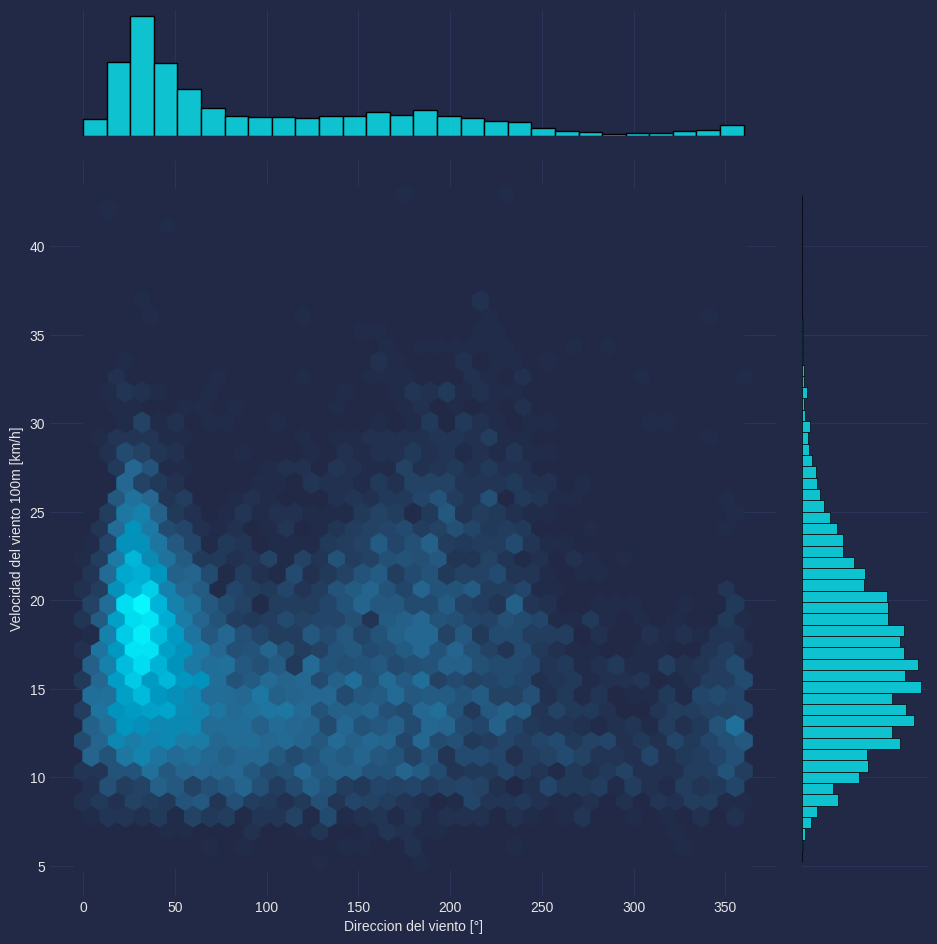

In [26]:
from matplotlib.colors import LinearSegmentedColormap

adjust_display()

ax=sns.jointplot(y=df["windspeed_10m_max"], x=df["winddirection_10m_dominant"], kind="hex")
ax.ax_joint._children[0].cmap=LinearSegmentedColormap.from_list(name="alex", colors=["#212946", "#256690", "#1a7da7", "#0094bd", "#00acd1", "#00c5e3", "#00def2", "#08f7fe"])
ax._figure._localaxes[0].yaxis.label._text="Velocidad del viento 100m [km/h]"
ax._figure._localaxes[0].xaxis.label._text="Direccion del viento [°]"
ax.figure.set_dpi(100)
ax.figure.set_size_inches(10, 10);

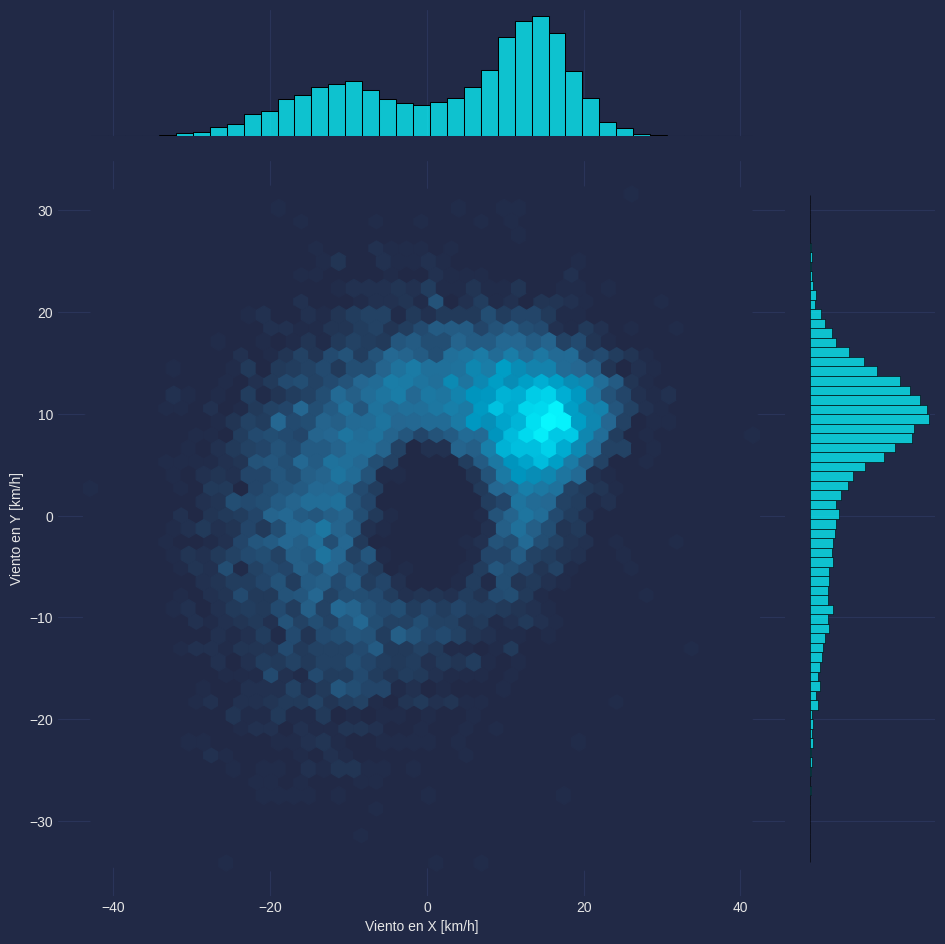

In [27]:
wind_direction_rad = df["winddirection_10m_dominant"]*np.pi / 180    #A radianes
df['wind_x'] = df["windspeed_10m_max"]*np.cos(wind_direction_rad)
df['wind_y'] = df["windspeed_10m_max"]*np.sin(wind_direction_rad)

ax=sns.jointplot(y=df['wind_y'], x=df['wind_x'], kind="hex")
ax.ax_joint._children[0].cmap=LinearSegmentedColormap.from_list(name="alex", colors=["#212946", "#256690", "#1a7da7", "#0094bd", "#00acd1", "#00c5e3", "#00def2", "#08f7fe"])
ax._figure._localaxes[0].yaxis.label._text="Viento en Y [km/h]"
ax._figure._localaxes[0].xaxis.label._text="Viento en X [km/h]"
ax.figure.set_dpi(100)
ax.figure.set_size_inches(10, 10);

# Data storytelling

## ☂️ Llevo el paraguas o lo dejo en casa?

Esta es una pregunta muy frecuente que nos hacemos antes de salir de casa cuando tenemos indicios de que el cielo puede precipitarse, por lo que antes que nada, definamos la variable que nos ayudara a predecir la cantidad de precipitacion que habra el dia de mañana, la cual nos servira como target para la tarea que deseamos realizar.

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8793 entries, 0 to 8792
Data columns (total 43 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   time                        8793 non-null   datetime64[ns]
 1   weathercode                 8793 non-null   float64       
 2   temperature_2m_max          8793 non-null   float64       
 3   temperature_2m_min          8793 non-null   float64       
 4   temperature_2m_mean         8793 non-null   float64       
 5   apparent_temperature_max    8793 non-null   float64       
 6   apparent_temperature_min    8793 non-null   float64       
 7   apparent_temperature_mean   8793 non-null   float64       
 8   precipitation_sum           8793 non-null   float64       
 9   rain_sum                    8793 non-null   float64       
 10  snowfall_sum                8793 non-null   float64       
 11  precipitation_hours         8793 non-null   float64     

Claramente de todas estas variables la que es de nuestro interes para la prediccion es "precipitation" la cual nos indica la suma de precipitacion de la hora anterior en milimetros.


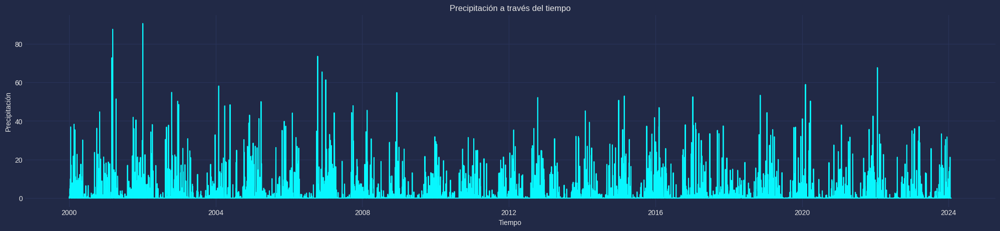

In [29]:
plt.figure(figsize=(25, 5))
sns.lineplot(data=df, y="precipitation_sum", x="time")
plt.xlabel("Tiempo")
plt.ylabel("Precipitación")
plt.title("Precipitación a través del tiempo");

Se puede observar un patron casi periodico, hay un lapso temporal donde las precipitaciones son minimas y otro lapso donde las precipitaciones alcanzan un maximo, para verlo mas claro calcularemos el Exponential Moving Average de las precipitaciones en un periodo de 4 meses.

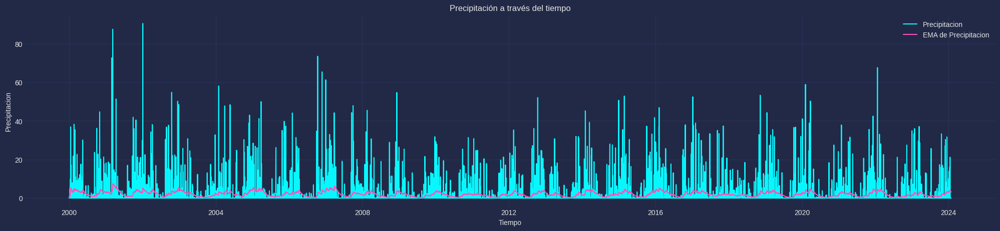

In [30]:
sma_precipitation = df["precipitation_sum"].ewm(7*6).mean() #Exponential moving average

plt.figure(figsize=(25, 5))
sns.lineplot(data=df, y="precipitation_sum", x="time", legend='brief', label="Precipitacion")
sns.lineplot(y=sma_precipitation,  x=df["time"], legend='brief', label="EMA de Precipitacion")
plt.xlabel("Tiempo")
plt.ylabel("Precipitacion")
plt.title("Precipitación a través del tiempo");

Se puede observar que un lapso de 4 años hay 4 maximos y 4 minimos, para verlo mas claramente hallemos los maximos y minimos.

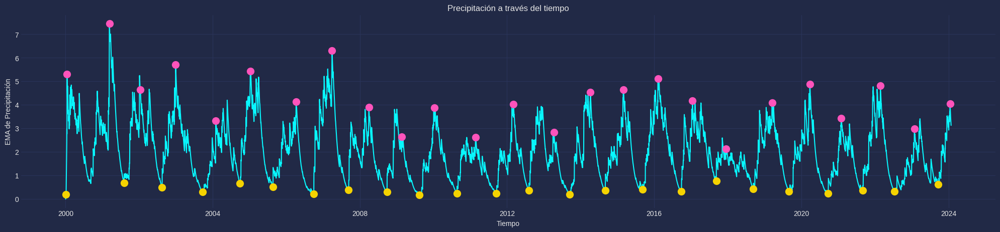

In [31]:
picos_index, _ = find_peaks(sma_precipitation, distance=7*4*11, height=2)
valles_index, _ = find_peaks(-sma_precipitation, distance=7*4*11)


plt.figure(figsize=(25, 5))
#sns.lineplot(data=df, y="precipitation", x="time")
sns.lineplot(y=sma_precipitation,  x=df["time"])
plt.plot(df.loc[picos_index, "time"], sma_precipitation[picos_index], "o", markersize=10)
plt.plot(df.loc[valles_index, "time"], sma_precipitation[valles_index], "o", markersize=10)
plt.xlabel("Tiempo")
plt.ylabel("EMA de Precipitación")
plt.title("Precipitación a través del tiempo");

## Periodo de acumulacion abundante de precipitaciones

In [32]:
df.loc[picos_index, "month"].value_counts().index.map({1:"Enero", 2:"Febrero", 3:"Marzo", 4:"Abril", 5:"Mayo", 6:"Junio", 7:"Julio", 8:"Agosto", 9:"Septiembre", 10:"Octubre", 11:"Noviembre", 12:"Diciembre"}).tolist()

['Enero', 'Marzo', 'Febrero', 'Abril', 'Diciembre']

## Periodo de acumulacion baja de precipitaciones

In [33]:
df.loc[valles_index, "month"].value_counts().index.map({1:"Enero", 2:"Febrero", 3:"Marzo", 4:"Abril", 5:"Mayo", 6:"Junio", 7:"Julio", 8:"Agosto", 9:"Septiembre", 10:"Octubre", 11:"Noviembre", 12:"Diciembre"}).tolist()

['Septiembre', 'Agosto', 'Enero', 'Julio']

A continuacion, veamos como las precipitaciones son menos abundantes hacia la mitad del año.

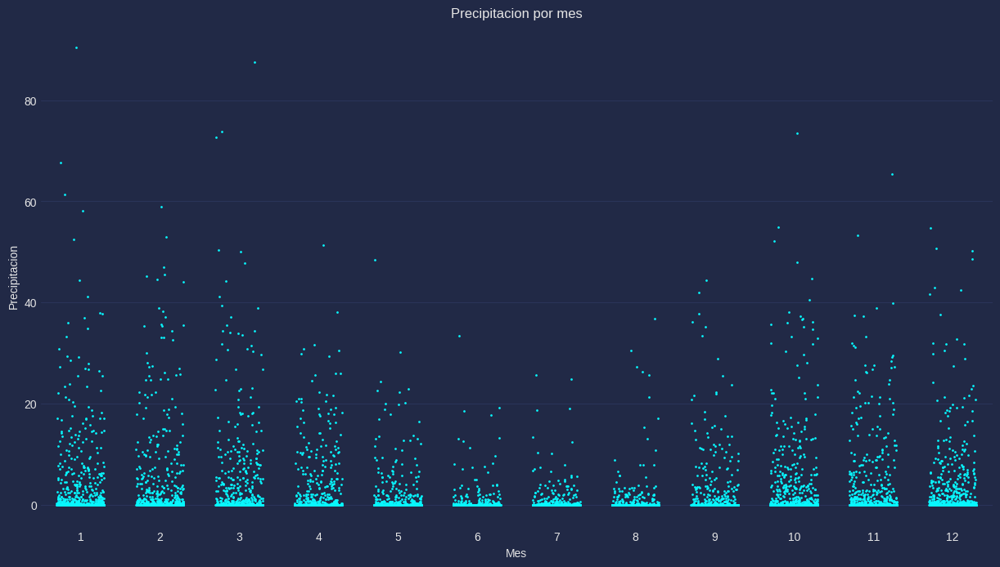

In [34]:
plt.figure(figsize=(15, 8))
sns.stripplot(data=df, y="precipitation_sum", x="month", jitter=0.3, size=2)
plt.xlabel("Mes")
plt.ylabel("Precipitacion");
plt.title("Precipitacion por mes");

## Temperatura

Algo curioso que podemos extraer del analisis anterior, es que el periodo de acumulacion de precipitaciones baja es a su vez un periodo de temperaturas bajas. Veamos si esto es asi.

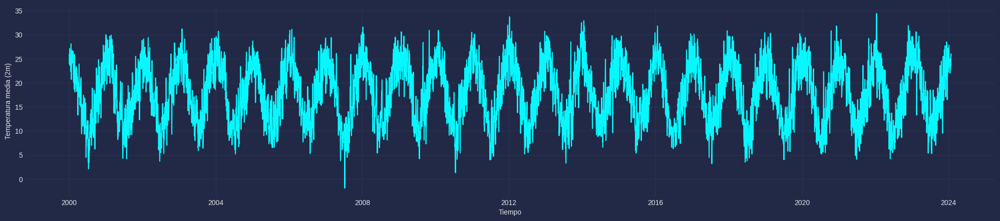

In [35]:
plt.figure(figsize=(25, 5))
sns.lineplot(data=df, y="temperature_2m_mean", x="time")
plt.xlabel("Tiempo")
plt.ylabel("Temperatura media (2m)");

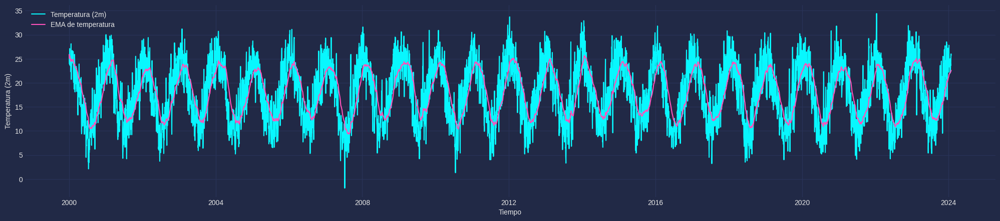

In [36]:
sma_temp = df["temperature_2m_mean"].ewm(7*6).mean()

plt.figure(figsize=(25, 5))
sns.lineplot(data=df, y="temperature_2m_mean", x="time", legend='brief', label="Temperatura (2m)")
sns.lineplot(y=sma_temp,  x=df["time"], legend='brief', label="EMA de temperatura")
plt.xlabel("Tiempo")
plt.ylabel("Temperatura (2m)");

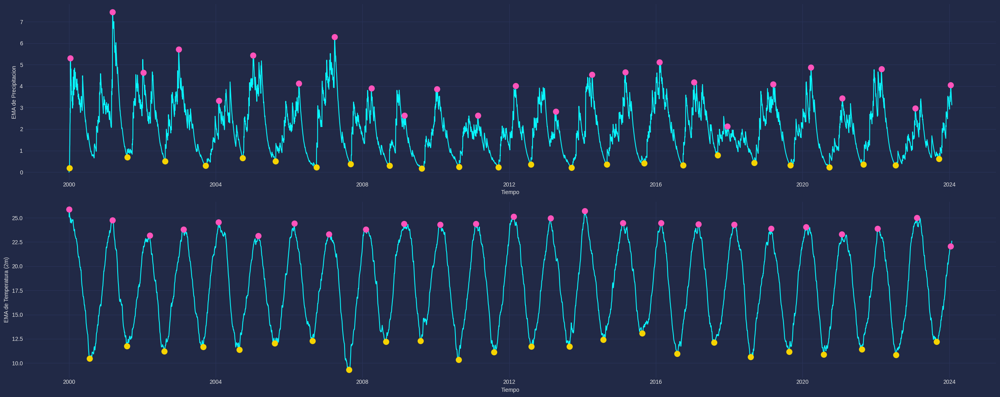

In [37]:
temp_picos_index, _ = find_peaks(sma_temp, distance=7*4*11, height=20)
temp_valles_index, _ = find_peaks(-sma_temp, distance=7*4*11)
picos_index, _ = find_peaks(sma_precipitation, distance=7*4*11, height=2)
valles_index, _ = find_peaks(-sma_precipitation, distance=7*4*11)

fig, axs = plt.subplots(2, 1, figsize=(25, 10))

plt.subplot(2,1,1)
sns.lineplot(y=sma_precipitation,  x=df["time"])
plt.plot(df.loc[picos_index, "time"], sma_precipitation[picos_index], "o", markersize=10)
plt.plot(df.loc[valles_index, "time"], sma_precipitation[valles_index], "o", markersize=10)
plt.ylabel("EMA de Precipitacion")
plt.xlabel("Tiempo")

plt.subplot(2,1,2)
sns.lineplot(y=sma_temp,  x=df["time"])
plt.plot(df.loc[temp_picos_index, "time"], sma_temp[temp_picos_index], "o", markersize=10)
plt.plot(df.loc[temp_valles_index, "time"], sma_temp[temp_valles_index], "o", markersize=10)
plt.ylabel("EMA de Temperatura (2m)")
plt.xlabel("Tiempo")

plt.tight_layout()

Como pudimos deducir, periodos de temperaturas bajas estan fuertemente relacionados con periodos de escasas precipitaciones y periodos de temperaturas altas estan relacionados con periodos de abundantes precipitaciones. Si lo pensamos es logico, la evaporacion del agua ocurre con temperaturas altas, a mayor temperatura mayor sera la facilidad de evaporacion del agua en el ambiente y esta misma evaporacion consigue condensarse en la atmosfera para posteriormente precipitarse sobre la superficie.

<img src="https://services.meteored.com/img/article/el-ciclo-del-agua-vives-inmerso-en-el-y-no-te-das-cuenta-3992-1_1280.jpg" width=700>

<IPython.core.display.Javascript object>

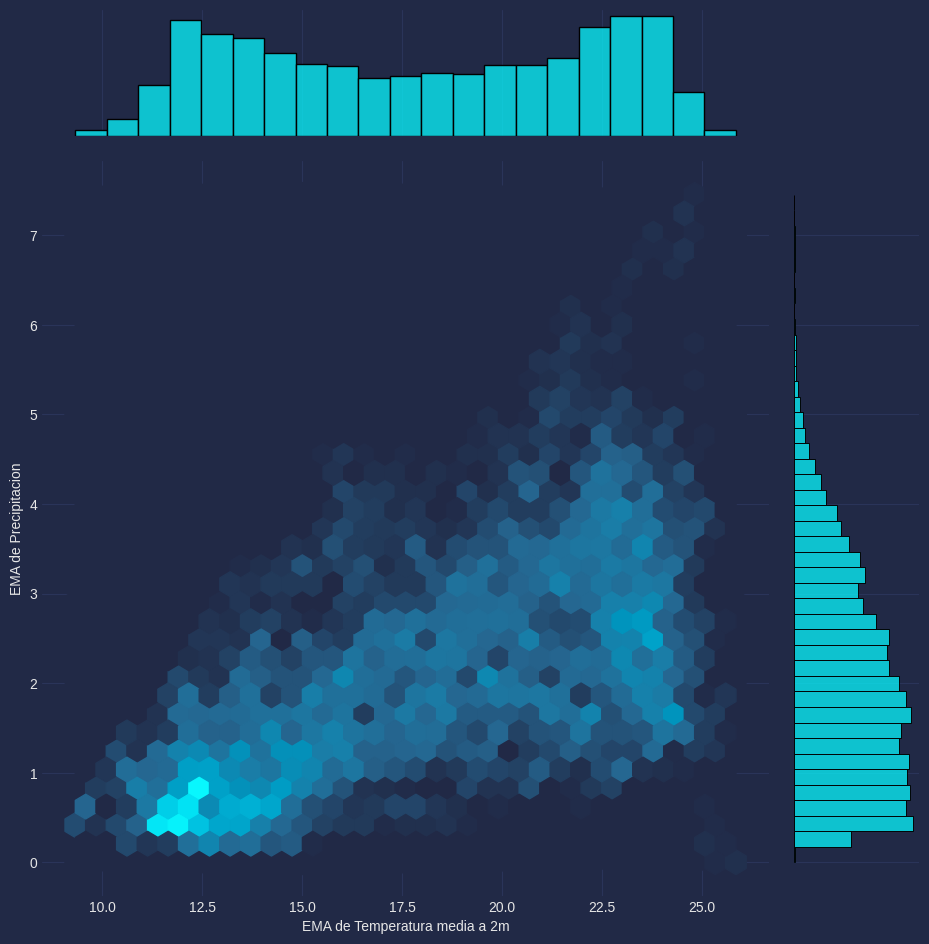

In [38]:
from matplotlib.colors import LinearSegmentedColormap

adjust_display()

ax=sns.jointplot(x=sma_temp, y=sma_precipitation, kind="hex")
ax.ax_joint._children[0].cmap=LinearSegmentedColormap.from_list(name="alex", colors=["#212946", "#256690", "#1a7da7", "#0094bd", "#00acd1", "#00c5e3", "#00def2", "#08f7fe"])
ax._figure._localaxes[0].xaxis.label._text="EMA de Temperatura media a 2m"
ax._figure._localaxes[0].yaxis.label._text="EMA de Precipitacion"
ax.figure.set_dpi(100)
ax.figure.set_size_inches(10, 10);

Por ultimo, podemos ver la relacion directa entre temperatura y precipitaciones, se ve claramente que precipitaciones abundanes se consiguen con temperaturas altas.

## Presion sobre la superficie

In [39]:
df_aux["date"] = pd.to_datetime(pd.to_datetime(df_aux["time"]).dt.date)
df_aux = df_aux[df_aux["date"] <= df["date"].max()].copy()
df["surface_pressure_mean"] = df_aux.groupby(by=["date"])["surface_pressure"].mean().values
df["surface_pressure_max"] = df_aux.groupby(by=["date"])["surface_pressure"].max().values
df["surface_pressure_min"] = df_aux.groupby(by=["date"])["surface_pressure"].min().values

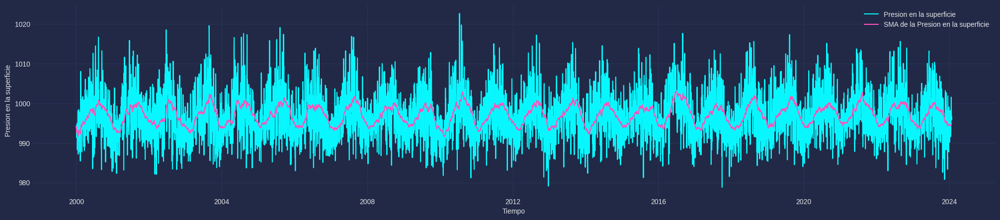

In [40]:
s_pressure = df["surface_pressure_mean"].ewm(7*6).mean()

plt.figure(figsize=(25, 5))
sns.lineplot(data=df, y="surface_pressure_mean", x="time", legend='brief', label="Presion en la superficie")
sns.lineplot(y=s_pressure,  x=df["time"], legend='brief', label="SMA de la Presion en la superficie");
plt.ylabel("Presion en la superficie")
plt.xlabel("Tiempo");

Nuevamente como procedimos con la temperatura, analizamos los maximos y minimos del SMA de la presion en la superficie, intentando encontrar alguna relacion con las precipitaciones.

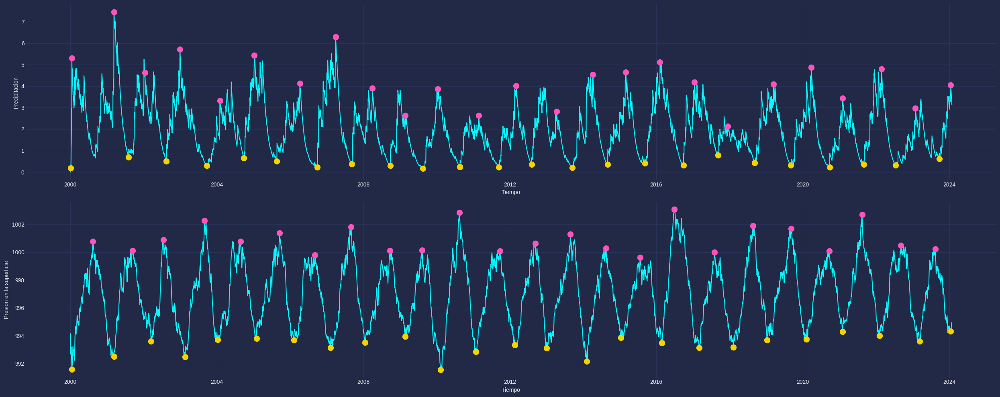

In [41]:
press_picos_index, _ = find_peaks(s_pressure, distance=7*4*11, height=997)
press_valles_index, _ = find_peaks(-s_pressure, distance=7*4*11)

picos_index, _ = find_peaks(sma_precipitation, distance=7*4*11, height=2)
valles_index, _ = find_peaks(-sma_precipitation, distance=7*4*11)

fig, axs = plt.subplots(2, 1, figsize=(25, 10))

plt.subplot(2,1,1)
sns.lineplot(y=sma_precipitation,  x=df["time"])
plt.plot(df.loc[picos_index, "time"], sma_precipitation[picos_index], "o", markersize=10)
plt.plot(df.loc[valles_index, "time"], sma_precipitation[valles_index], "o", markersize=10)
plt.ylabel("Precipitacion")
plt.xlabel("Tiempo")

plt.subplot(2,1,2)
sns.lineplot(y=s_pressure,  x=df["time"])
plt.plot(df.loc[press_picos_index, "time"], s_pressure[press_picos_index], "o", markersize=10)
plt.plot(df.loc[press_valles_index, "time"], s_pressure[press_valles_index], "o", markersize=10)
plt.ylabel("Presion en la superficie")
plt.xlabel("Tiempo")

plt.tight_layout()

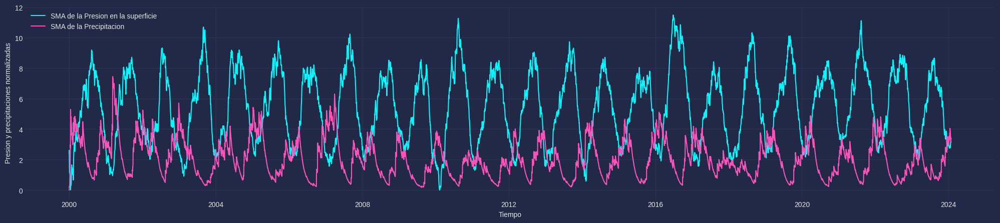

In [42]:
plt.figure(figsize=(25, 5))
sns.lineplot(y=s_pressure-s_pressure.min(),  x=df["time"], legend='brief', label="SMA de la Presion en la superficie");
sns.lineplot(y=sma_precipitation-sma_precipitation.min(),  x=df["time"], legend='brief', label="SMA de la Precipitacion");
plt.ylabel("Presion y precipitaciones normalizadas")
plt.xlabel("Tiempo");

Al igual que la temperatura, la presion superficial, que no es mas que la presion atmosferica pero medida al nivel del mar, influye sobre las precipitaciones, como podemos ver en temporadas donde la presion es relativamente mas baja las precipitaciones son mas abundantes, esto es debido a que al haber menor presion sobre una zona, el aire de los alrededores sera 'absorbido' con mayor facilidad.

<img src="https://services.meteored.com/img/article/alta-presion-de-bloqueo-que-significa-y-cuales-son-sus-consecuencias-1652995073963_1024.jpeg" width=700>

Esto sucede asi por que las presiones bajas indican zonas de aire menos concentrado y el aire de los alrededores, que estan en zonas de aire mas concentrado (presion alta), tendera a desplazarse a zonas de aire menos concentrado, arrastrando consigo vapor de agua, facilitando asi la formacion de nubosidades, y estas ultimas que ya no estaran formadas por vapor, si no, por agua se precipitaran posteriormente sobre la superficie. Para conocer mas sobre la presion atmosferica pueden seguir este [articulo de METEORED](https://www.meteored.cl/noticias/ciencia/desvendando-misterios-del-tiempo-atmosferico-que-son-las-altas-y-bajas-presiones.html#:~:text=Las%20bajas%20presiones%2C%20al%20contener,más%20baja%20sea%20la%20presión.).



<IPython.core.display.Javascript object>

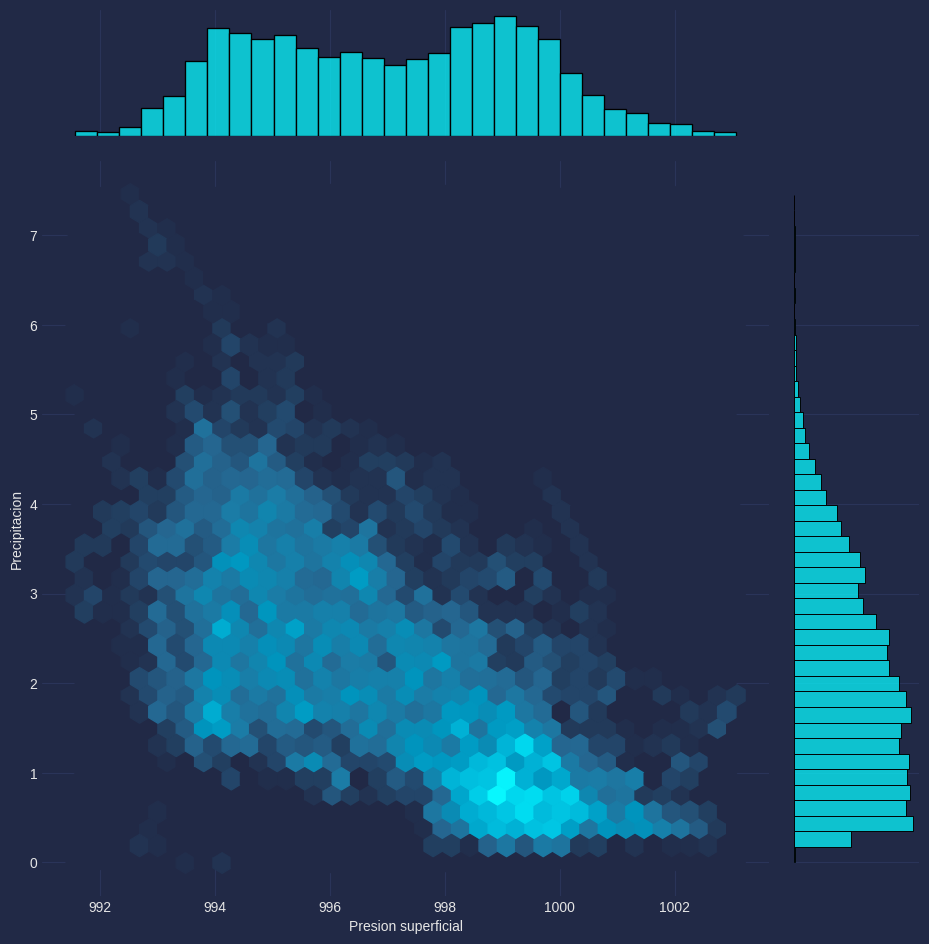

In [43]:
adjust_display()

ax=sns.jointplot(x=s_pressure, y=sma_precipitation, kind="hex")
ax.ax_joint._children[0].cmap=LinearSegmentedColormap.from_list(name="alex", colors=["#212946", "#256690", "#1a7da7", "#0094bd", "#00acd1", "#00c5e3", "#00def2", "#08f7fe"])
ax._figure._localaxes[0].xaxis.label._text="Presion superficial"
ax._figure._localaxes[0].yaxis.label._text="Precipitacion"
ax.figure.set_dpi(100)
ax.figure.set_size_inches(10, 10);

Al contrario de lo que sucede con la temperatura, cuando la presion es baja las precipitaciones que se presentan suelen ser mas altas.

## Entre altura, viento y nubes

In [44]:
df["windspeed_100m_max"] = df_aux.groupby(by=["date"])["windspeed_100m"].max().values
df["windspeed_100m_min"] = df_aux.groupby(by=["date"])["windspeed_100m"].min().values
df["windspeed_100m_mean"] = df_aux.groupby(by=["date"])["windspeed_100m"].mean().values

df["windspeed_10m_min"] = df_aux.groupby(by=["date"])["windspeed_10m"].min().values
df["windspeed_10m_mean"] = df_aux.groupby(by=["date"])["windspeed_10m"].mean().values

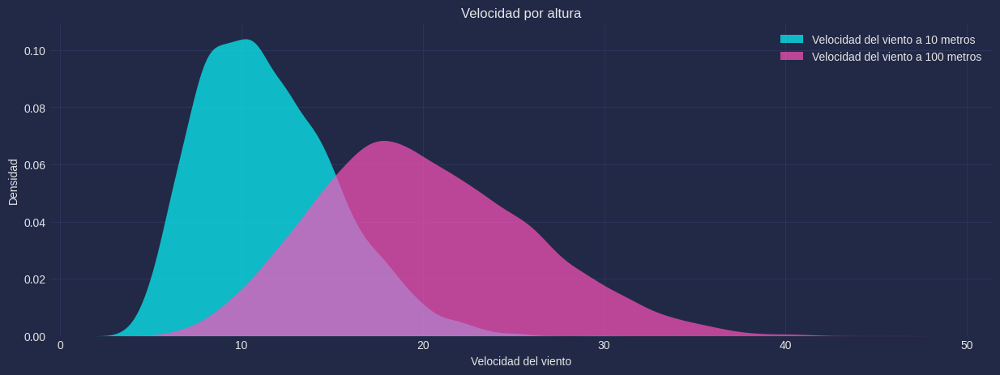

In [45]:
plt.figure(figsize=(15, 5))
sns.kdeplot(data=df, x="windspeed_10m_mean", fill=True, common_norm=False, alpha=.7, linewidth=0, legend='brief', label="Velocidad del viento a 10 metros")
sns.kdeplot(data=df, x="windspeed_100m_mean", fill=True, common_norm=False, alpha=.7, linewidth=0, legend='brief', label="Velocidad del viento a 100 metros")
plt.xlabel("Velocidad del viento")
plt.ylabel("Densidad")
plt.title("Velocidad por altura")
plt.legend();

In [46]:
df[["windspeed_10m_mean", "windspeed_100m_mean"]].describe().T

,count,mean,std,min,25%,50%,75%,max
windspeed_10m_mean,8793.0,11.456241,3.745291,3.625,8.583333,10.987500,13.891667,29.725000
windspeed_100m_mean,8793.0,20.094200,5.887479,5.375,15.845833,19.533333,24.020833,46.141667


Como podemos ver cuanto mayor es la altura de medicion mayor es la velocidad media que podemos detectar, esto puede deberse a multiples factores, pero quizas la explicacion mas intuitiva es que el aire a mayor altura es probable que circule con mayor libertad y enfrenta menos obstaculos lo que facilita un incremento de la velocidad. Y te preguntaras ¿Y esto como influye en las precipitaciones? Bueno es muy simple, si el aire circula facilmente sobre la atmosfera desplazando nubosidades y/o facilitando la acumulacion de vapores de agua, creara areas de alta concentracion de nubosidades que mas temprano que tarde se podrian precipitar.

<img src="https://drive.google.com/uc?export=view&id=13JKrLQG7weei0jmdB484WLCEztLb1F8Q" height=500>


En los estratos mas bajos de la atmosfera se concentran las nubosidades con altas concentraciones de agua, esto quizas sea debido a la densidad del agua con respecto a otros gases, por lo que seria razonable que en situaciones de altas precipitaciones el porcentaje de cielo cubierto por nubes sea mayor.

In [47]:
df["cloudcover_low_max"] = df_aux.groupby(by=["date"])["cloudcover_low"].max().values
df["cloudcover_low_min"] = df_aux.groupby(by=["date"])["cloudcover_low"].min().values
df["cloudcover_low_mean"] = df_aux.groupby(by=["date"])["cloudcover_low"].mean().values

df["cloudcover_mid_max"] = df_aux.groupby(by=["date"])["cloudcover_mid"].max().values
df["cloudcover_mid_min"] = df_aux.groupby(by=["date"])["cloudcover_mid"].min().values
df["cloudcover_mid_mean"] = df_aux.groupby(by=["date"])["cloudcover_mid"].mean().values

df["cloudcover_high_max"] = df_aux.groupby(by=["date"])["cloudcover_high"].max().values
df["cloudcover_high_min"] = df_aux.groupby(by=["date"])["cloudcover_high"].min().values
df["cloudcover_high_mean"] = df_aux.groupby(by=["date"])["cloudcover_high"].mean().values

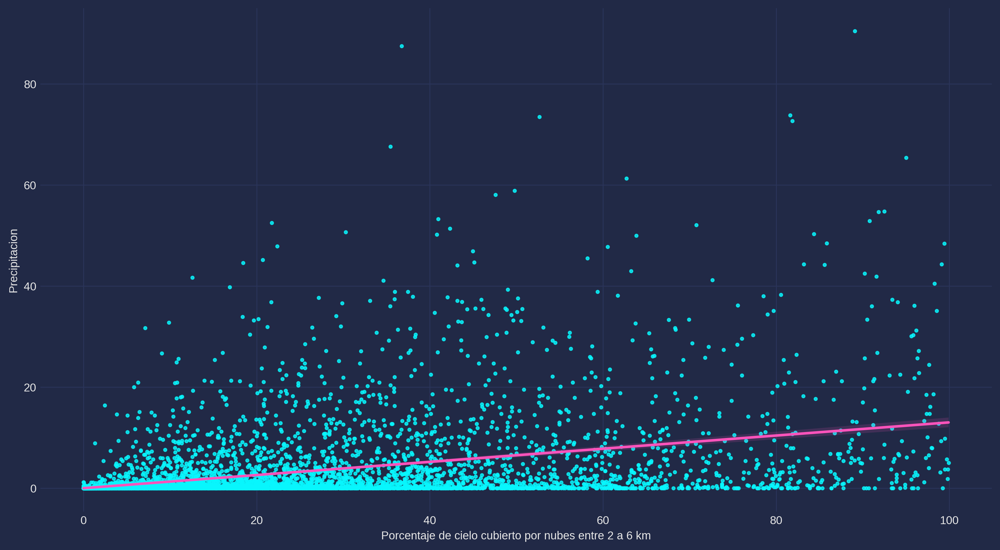

In [48]:
plt.figure(figsize=(15, 8), dpi=300)
sns.regplot(data=df, x="cloudcover_mid_mean", y="precipitation_sum", scatter_kws={"s": 7}, line_kws={"color": "C1"})
plt.xlabel("Porcentaje de cielo cubierto por nubes entre 2 a 6 km")
plt.ylabel("Precipitacion");

Vemos que hay una ligera tendencia a tener el cielo porcentualmente mas cubierto cuando hay mayor cantidad de precipitaciones. Es intuitivo. Y si vemos la velocidad del viento frente a las precipitaciones?



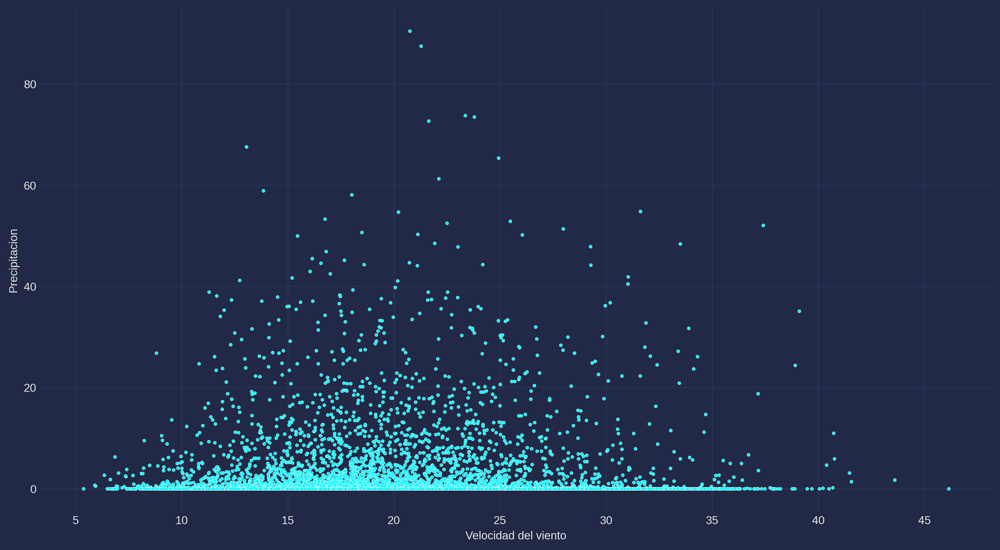

In [49]:
plt.figure(figsize=(15, 8), dpi=300)
sns.scatterplot(data=df, x="windspeed_100m_mean", y="precipitation_sum", s=8)
plt.xlabel("Velocidad del viento")
plt.ylabel("Precipitacion");

Bueno esto es un poco contraintuitivo, pero si lo pensamos bien, asi como los fuertes vientos pueden arrastrar lluvias tambien pueden llevarselas, por lo que es logico pensar que en el momento de mayores precipitaciones la velocidad del viento sea menor una vez que la precipitacion esta establecida, se esperaria que la velocidad sea mayor hasta arrastrarla dentro del territorio donde se realiza el sondeo, pero no siempre es asi, la naturaleza juega sus propias reglas.

## Descomposicion estacional

<IPython.core.display.Javascript object>

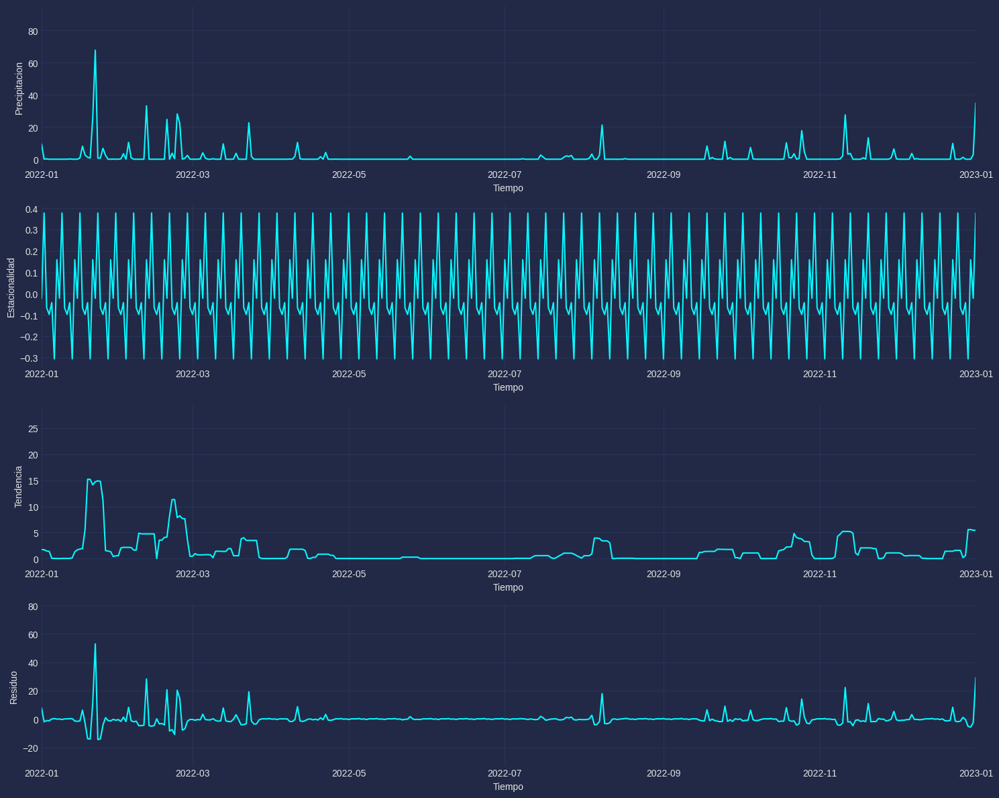

In [50]:
from statsmodels.tsa.seasonal import seasonal_decompose
import datetime

adjust_display()

df.set_index('time', inplace=True)
stl = seasonal_decompose(df["precipitation_sum"])

fig, axs = plt.subplots(4, 1, figsize=(15, 12))

plt.subplot(4, 1, 1)
sns.lineplot(x=df.index, y=df.precipitation_sum)
plt.xlim(datetime.date(2022, 1, 1), datetime.date(2023, 1, 1))
plt.ylabel("Precipitacion")
plt.xlabel("Tiempo")

plt.subplot(4, 1, 2)
sns.lineplot(x=df.index, y=stl.seasonal)
plt.xlim(datetime.date(2022, 1, 1), datetime.date(2023, 1, 1))
plt.ylabel("Estacionalidad")
plt.xlabel("Tiempo")

plt.subplot(4, 1, 3)
sns.lineplot(x=df.index, y=stl.trend)
plt.xlim(datetime.date(2022, 1, 1), datetime.date(2023, 1, 1))
plt.ylabel("Tendencia")
plt.xlabel("Tiempo")

plt.subplot(4, 1, 4)
sns.lineplot(x=df.index, y=stl.resid)
plt.xlim(datetime.date(2022, 1, 1), datetime.date(2023, 1, 1))
plt.ylabel("Residuo")
plt.xlabel("Tiempo");

plt.tight_layout()

# Deteccion de outliers

In [51]:
df.describe()

,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration,hour,month,year,day_sin,day_cos,month_sin,month_cos,week_sin,week_cos,quarter_sin,quarter_cos,day_of_year_sin,day_of_year_cos,day_of_week_sin,day_of_week_cos,sunset_hour_sin,sunset_hour_cos,sunset_minute_sin,sunset_minute_cos,sunrise_hour_sin,sunrise_hour_cos,sunrise_minute_sin,sunrise_minute_cos,wind_x,wind_y,surface_pressure_mean,surface_pressure_max,surface_pressure_min,windspeed_100m_max,windspeed_100m_min,windspeed_100m_mean,windspeed_10m_min,windspeed_10m_mean,cloudcover_low_max,cloudcover_low_min,cloudcover_low_mean,cloudcover_mid_max,cloudcover_mid_min,cloudcover_mid_mean,cloudcover_high_max,cloudcover_high_min,cloudcover_high_mean
count,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.0,8793.000000,8793.000000,8793.000000,8793.000000,8.793000e+03,8793.000000,8793.000000,8.793000e+03,8.793000e+03,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8.793000e+03,8793.000000,8793.000000,8793.000000,8.793000e+03,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000
mean,19.680428,23.217776,13.292938,17.955362,22.825964,11.858751,16.923780,2.031514,2.030217,0.000923,2.042534,16.832947,35.569749,103.588081,17.926385,3.927765,0.0,6.505971,2011.537359,0.001537,0.014259,-3.351359e-03,0.082469,0.000501,6.407491e-03,-2.363768e-03,0.250768,0.000675,0.003650,-0.000098,0.142898,-0.952808,2.194070e-01,0.193157,-0.161189,0.953529,-1.920305e-01,0.190122,0.116281,3.326256,6.049867,997.072000,1000.177152,993.973126,29.444103,10.665632,20.094200,6.046787,11.456241,36.051291,3.090868,15.445586,43.867508,2.070169,15.663956,65.337996,2.207210,25.817194
std,26.146643,6.604508,5.918701,6.110164,8.569881,7.453682,7.736397,6.231221,6.230963,0.054953,4.104638,4.887467,10.309499,87.477898,8.239629,2.115756,0.0,3.457133,6.946517,0.701812,0.712298,6.759099e-01,0.732425,0.704955,7.093033e-01,6.120892e-01,0.750042,0.705960,0.708322,0.654719,0.742317,0.054558,2.025964e-01,0.687535,0.681256,0.051828,2.263315e-01,0.679572,0.699015,13.403553,8.941036,5.864526,5.826401,6.184240,6.469058,7.265759,5.887479,3.811519,3.745291,43.426876,14.390998,26.245855,39.904166,9.213533,21.422362,38.357342,9.671224,24.871852
min,0.000000,2.400000,-9.600000,-1.900000,-0.800000,-14.500000,-6.200000,0.000000,0.000000,0.000000,0.000000,5.200000,12.600000,0.000000,0.860000,0.200000,0.0,1.000000,2000.000000,-0.994522,-1.000000,-9.898214e-01,-0.959493,-1.000000,-1.000000e+00,-8.660254e-01,-0.500000,-0.999991,-0.999963,-0.866025,-1.000000,-1.000000,-1.836970e-16,-1.000000,-1.000000,0.866025,-5.000000e-01,-1.000000,-1.000000,-42.841207,-34.021873,978.804167,984.500000,971.900000,11.000000,0.000000,5.375000,0.000000,3.625000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,18.100000,8.600000,12.900000,16.000000,5.800000,10.500000,0.000000,0.000000,0.000000,0.000000,13.200000,28.100000,33.000000,11.500000,2.130000,0.0,4.000000,2006.000000,-0.743145,-0.669131,-7.557496e-01,-0.654861,-0.663123,-6.631227e-01,-8.660254e-01,-0.500000,-0.705584,-0.708627,-0.866025,-0.500000,-1.000000,-1.836970e-16,-0.406737,-0.809017,0.965926,-2.588190e-01,-0.309017,-0.587785,-8.588940,2.213863,992.929167,996.000000,989.700000,25.000000,4.700000,15.845833,3.300000,8.583333,0.000000,0.000000,0.000000,1.000000,0.000000,0.083333,29.000000,0.000000,3.333333
50%,2.000000,23.400000,13.500000,18

Antes de iniciar con la deteccion, a priori podemos decir que no pueden haber valores negativos de precipitacion, ya que esto es inconsistente con la realidad, en todo caso el valor minimo puede ser 0.

In [52]:
df.loc[df["precipitation_sum"] < 0, "precipitation_sum"] = 0

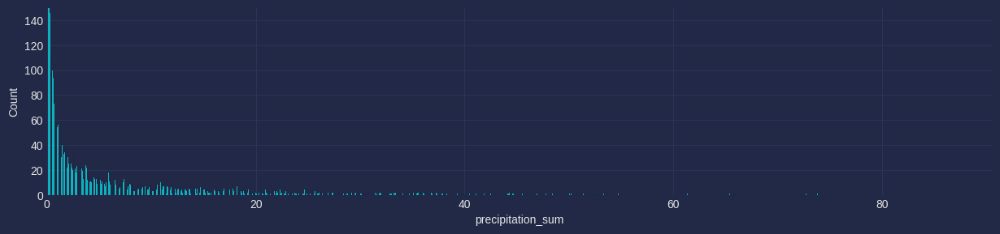

In [53]:
plt.figure(figsize=(15, 3))
sns.histplot(df["precipitation_sum"])
plt.ylim(0, 150)
plt.xlim(0, df["precipitation_sum"].max());

### Deteccion con arboles de clasificación (CART)
Podemos utilizar el poder y la solidez de los árboles de decisión para identificar valores atípicos/anomalías en datos de series temporales.

La idea principal, que es diferente de otros métodos populares de detección de valores atípicos, es que Isolation Forest identifica explícitamente anomalías en lugar de perfilar puntos de datos normales. Isolation Forest, como cualquier método de conjunto de árboles, se basa en árboles de decisión.

In [54]:
from sklearn.ensemble import IsolationForest

scaler = StandardScaler()
np_scaled = scaler.fit_transform(df[["precipitation_sum"]])
model = IsolationForest(contamination=0.005)
model.fit(np_scaled)

IsolationForest(contamination=0.005)

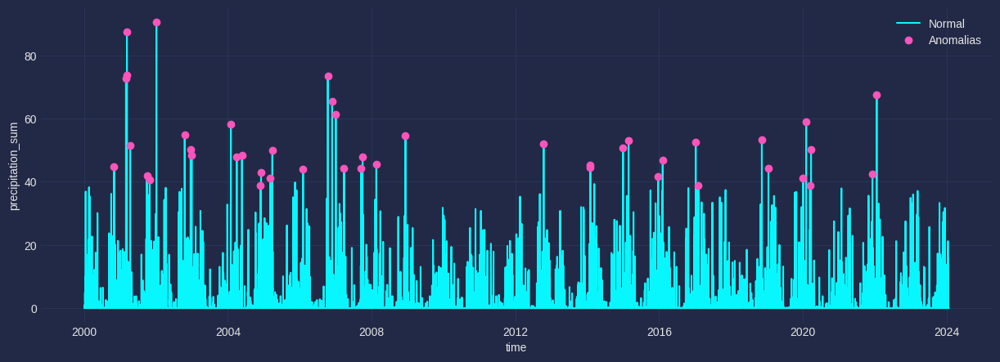

In [55]:
outliers = pd.DataFrame(data={"time":df.index})
outliers["precipitation_sum"] = df["precipitation_sum"].values
outliers["anomalies"] = model.predict(np_scaled)

anomalies = outliers[outliers["anomalies"] == -1] #Anomalias

plt.figure(figsize=(15,5))
sns.lineplot(x=df.index, y=df["precipitation_sum"], legend="brief", label = 'Normal')
plt.plot(anomalies.time, anomalies["precipitation_sum"], label='Anomalias', marker="o", linestyle="")
plt.legend();

Una vez detectados estos puntos anomalos, podemos reacondiconarlos para lograr

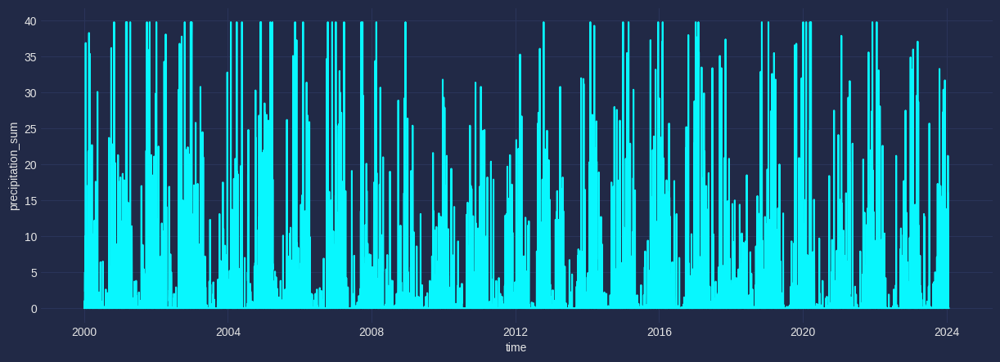

In [56]:
outliers.loc[outliers["anomalies"] == -1, "precipitation_sum"] = outliers[outliers["anomalies"] != -1].precipitation_sum.max()

plt.figure(figsize=(15,5))
sns.lineplot(x=outliers.time, y=outliers["precipitation_sum"]);

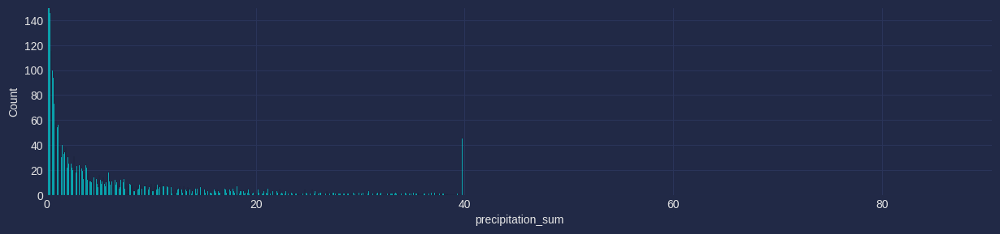

In [57]:
plt.figure(figsize=(15, 3))
sns.histplot(outliers["precipitation_sum"])
plt.ylim(0, 150)
plt.xlim(0, df["precipitation_sum"].max());

In [58]:
df_ = df.copy()
df_["precipitation_sum"] = outliers["precipitation_sum"].values

# Eliminando columnas redundantes

## Date y time
Esta columna esta implicita en "time" y desfragmentada en otras variables tales como "day", "month" y "year", entre otros, por lo que conservaremos solamente "time" ya que nos sirve como indice.

In [59]:
df_.drop(["date"], axis=1, inplace=True)

## Caracteristicas relacionadas directamente a nuestro target
Nuestro target es la prediccion de precipitaciones, hay una variable que nos es util para esto y esta denominada como "precipitation_sum" que es equivalente a la suma de "rain_sum" y "snowfall_sum" por lo que estas variables deberian descartarse ya que a priori estan contenidas por nuestro target.

Por otro lado, "weathercode" es el [WMO Code](https://www.jodc.go.jp/data_format/weather-code.html) que nos indica a travez de una serie de codigos la condicion climatica presente, por lo que este codigo nos adelanta de antemano informacion que buscamos predecir (ver por ejemplo "Present Weather (WMO Code 4677) - Code 54" en el enlace anterior) por lo que podriamos descartarlo tambien.

In [60]:
df_.drop([
    "rain_sum",
    "snowfall_sum",
    "month",
    #"weathercode"
    ], axis=1, inplace=True)

# Separacion en set de datos de entrenamiento, validación y prueba

Tengamos en cuenta que estamos en presencia de un set de datos del tipo Serie temporal, por lo que la division del set no puede romper la cronologia de eventos, por lo que consideraremos los ultimos 4 años como sets de prueba y validacion, el resto se utilizara para entrenamiento.

In [61]:
#Cada registro representa una hora, por lo que extraer los ultimos 2400 registros es equivalente a extraer los ultimos 100 dias.
dias = 365*4 #Aproximadamente 6 meses
test_size = dias

train = df_[0:-test_size].copy()
test = df_[-test_size:].copy()

valid = test[0:-test_size//2].copy()
test = test[-test_size//2:].copy()

train.shape, valid.shape, test.shape

((7333, 55), (730, 55), (730, 55))

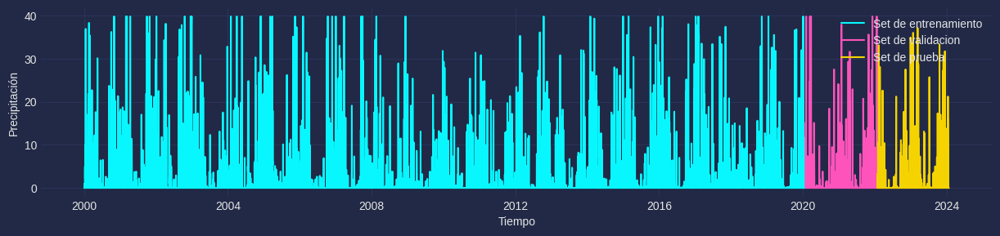

In [62]:
plt.figure(figsize=(15,3))
sns.lineplot(data=train, x="time", y="precipitation_sum", legend="brief", label="Set de entrenamiento");
sns.lineplot(data=valid, x="time", y="precipitation_sum", legend="brief", label="Set de validacion")
sns.lineplot(data=test, x="time", y="precipitation_sum", legend="brief", label="Set de prueba")
plt.xlabel("Tiempo")
plt.ylabel("Precipitación")
plt.legend(loc="upper right");

#Feature selection

In [63]:
fs_rg = SelectKBest(score_func=f_regression, k=40)
X_train = fs_rg.fit_transform(train.drop(["precipitation_sum"], axis=1), train["precipitation_sum"])
X_test = fs_rg.transform(test.drop(["precipitation_sum"], axis=1))
X_val = fs_rg.transform(valid.drop(["precipitation_sum"], axis=1))
train.shape, X_train.shape

((7333, 55), (7333, 40))

In [64]:
train = train[fs_rg.get_feature_names_out().tolist()+["precipitation_sum"]].copy()
test = test[fs_rg.get_feature_names_out().tolist()+["precipitation_sum"]].copy()
valid = valid[fs_rg.get_feature_names_out().tolist()+["precipitation_sum"]].copy()

## Caracteristicas mas importantes

<IPython.core.display.Javascript object>

<ipython-input-65-90ebdb28a1f7>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_scores, x="Scores", y="Features", palette="plasma", order=feature_scores.sort_values(by="Scores", ascending=False)["Features"]);


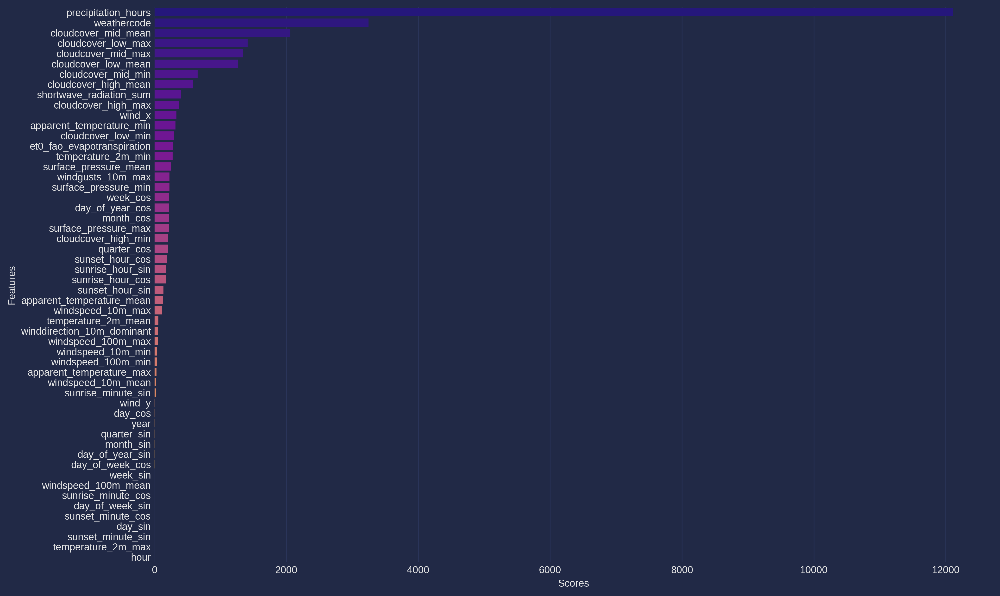

In [65]:
adjust_display()
plt.figure(figsize=(15, 10), dpi=300)
feature_scores = pd.DataFrame({"Features":fs_rg.feature_names_in_, "Scores":fs_rg.scores_})
sns.barplot(data=feature_scores, x="Scores", y="Features", palette="plasma", order=feature_scores.sort_values(by="Scores", ascending=False)["Features"]);

## Correlaciones

<IPython.core.display.Javascript object>

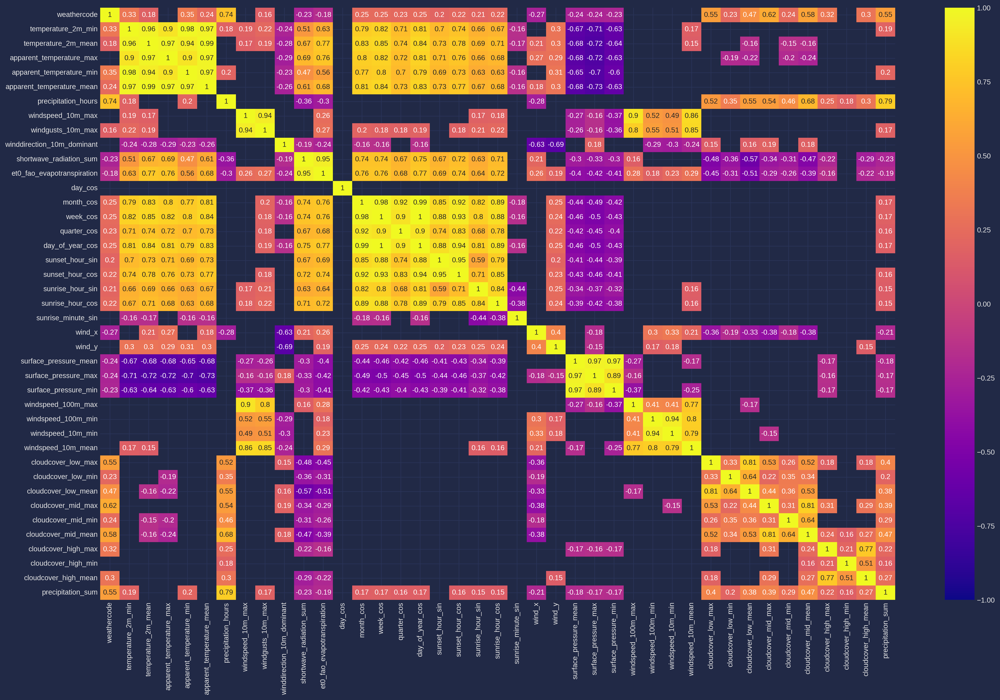

In [66]:
adjust_display()

plt.figure(figsize=(25, 15), dpi=300)
sns.heatmap(train.corr(), cmap="plasma", vmin=-1, vmax=1, mask=np.abs(train.corr()) < 0.15, annot=True);

## Detectando problemas de multicolinealidad

In [67]:
def detect_VIF(train):
    train_ = train.copy()
    train_['intercept'] = 1
    with np.errstate(divide='ignore'):
        while(True):
            train_vif = pd.DataFrame(columns=["Features", "VIF"])
            train_vif["Features"] = train_.columns
            train_vif["VIF"] = [variance_inflation_factor(train_.values, i) for i in range(len(train_.columns))]
            train_vif = train_vif[train_vif["Features"] != "intercept"].sort_values("VIF", ascending=False)
            if train_vif.iloc[0]["VIF"] > 10:
                train_.drop([train_vif.iloc[0]["Features"]], axis=1, inplace=True)
            else:
                break
    train_.drop(["intercept"], axis=1, inplace=True)
    return train[train_.columns.tolist()].copy(), train_vif.reset_index(drop=True)

train_clean, train_vif = detect_VIF(train.drop(["precipitation_sum"], axis=1))
train_vif

,Features,VIF
0,et0_fao_evapotranspiration,8.801841
1,surface_pressure_max,8.592624
2,sunrise_hour_cos,8.500853
3,surface_pressure_min,7.770581
4,cloudcover_mid_mean,7.172999
5,cloudcover_low_mean,6.220647
6,apparent_temperature_min,5.064610
7,sunrise_hour_sin,4.752958
8,cloudcover_low_max,4.538981
9,cloudcover_mid_max,4.496590


In [68]:
train_ = pd.concat([train_clean, train["precipitation_sum"]], axis=1)

<IPython.core.display.Javascript object>

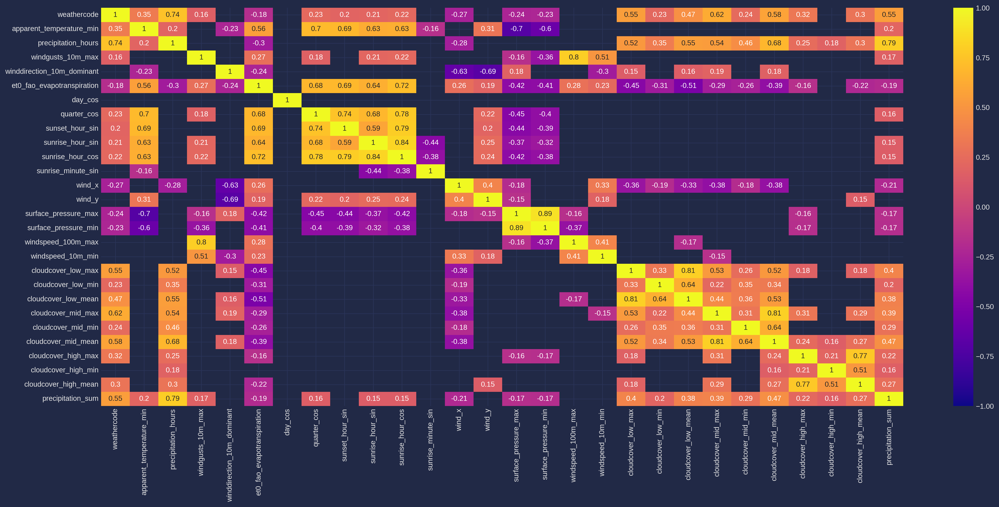

In [69]:
adjust_display()

plt.figure(figsize=(25, 10), dpi=300)
sns.heatmap(train_.corr(), cmap="plasma", vmin=-1, vmax=1, mask=np.abs(train_.corr()) < 0.15, annot=True);

In [70]:
df_train = train_.copy()
df_test = test[train_.columns].copy()
df_valid = valid[train_.columns].copy()

# Feature Scaling

In [71]:
mms_X = MinMaxScaler(feature_range=(0,1))
mms_y = MinMaxScaler(feature_range=(0,1))

train_arr_X = mms_X.fit_transform(df_train.drop(["precipitation_sum"], axis=1)).astype("float32")
train_arr_y = mms_y.fit_transform(df_train[["precipitation_sum"]]).astype("float32")

valid_arr_X = mms_X.fit_transform(df_valid.drop(["precipitation_sum"], axis=1)).astype("float32")
valid_arr_y = mms_y.fit_transform(df_valid[["precipitation_sum"]]).astype("float32")

test_arr_X = mms_X.transform(df_test.drop(["precipitation_sum"], axis=1)).astype("float32")
test_arr_y = mms_y.transform(df_test[["precipitation_sum"]]).astype("float32")

train_arr = np.hstack([train_arr_X, train_arr_y])
valid_arr = np.hstack([valid_arr_X, valid_arr_y])
test_arr = np.hstack([test_arr_X, test_arr_y])

# Ventanas temporales

Nuestra ventana temporal observara el sondeo de un tiempo de largo "window_size" y avanzara "step_size" pasos por el dataset. Aqui hay una cuestion para realizar la prediccion para el primer dia del set de prueba, necesitamos los "window_size" dias previos a este. Por lo que los añadiremos previamente.

## Analisis de autocorrelación

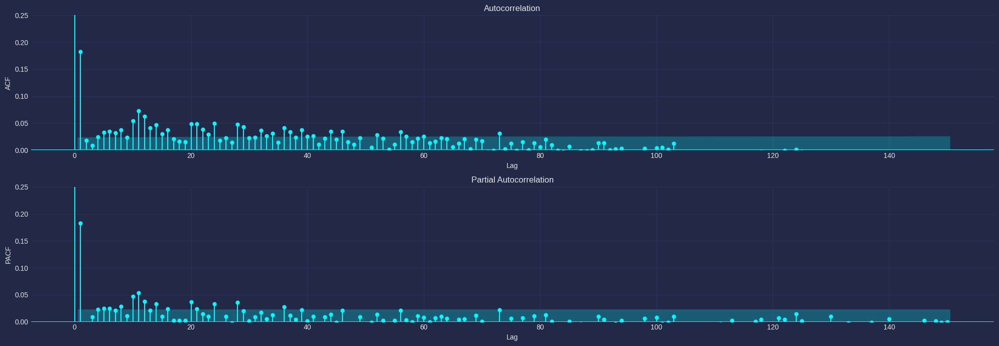

In [72]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axs= plt.subplots(2, 1, figsize=(20, 7))
lags = 150

plt.subplot(2, 1, 1)
plot_acf(train_arr[:, -1], lags=lags, ax=axs[0])
plt.ylim(0, 0.25)
plt.xlabel("Lag")
plt.ylabel("ACF")

plt.subplot(2, 1, 2)
plot_pacf(train_arr[:, -1], lags=lags, ax=axs[1])
plt.ylim(0, 0.25)
plt.xlabel("Lag")
plt.ylabel("PACF");

plt.tight_layout()

In [73]:
from statsmodels.tsa.stattools import acf

df_lags = pd.DataFrame(data={"Lags":np.arange(0, lags+1), "ACF":acf(x=train_arr[:,-1], nlags=lags)}).sort_values("ACF", ascending=False)
df_lags.head(10)

,Lags,ACF
0,0,1.000000
1,1,0.182501
11,11,0.072301
12,12,0.061948
10,10,0.053750
24,24,0.049239
21,21,0.048334
20,20,0.048230
28,28,0.047905
14,14,0.046996


Nos enfocaremos en los lags mayores a 0, ya que con lag-0 estamos ante la autocorrelacion de la señal consigo misma sin retrasar.

In [74]:
lags = df_lags[df_lags.Lags > 1 ]["Lags"].values[0]
lags

11

In [75]:
def get_indices(data, window_size, step_size):
  last_step = len(data) # El -1 es debido a que la secuencia inicia en 0

  window_start = 0
  window_end = window_size

  indices = []

  while window_end <= last_step:
    indices.append((window_start, window_end))

    window_start += step_size
    window_end += step_size

  return indices

window_size = lags #+ 1 #Empieza con cero
target_size = 7
step_size = 1

train_indices = get_indices(train_arr, window_size+target_size, step_size)
valid_indices = get_indices(valid_arr, window_size+target_size, step_size)

print(train_indices)

[(0, 18), (1, 19), (2, 20), (3, 21), (4, 22), (5, 23), (6, 24), (7, 25), (8, 26), (9, 27), (10, 28), (11, 29), (12, 30), (13, 31), (14, 32), (15, 33), (16, 34), (17, 35), (18, 36), (19, 37), (20, 38), (21, 39), (22, 40), (23, 41), (24, 42), (25, 43), (26, 44), (27, 45), (28, 46), (29, 47), (30, 48), (31, 49), (32, 50), (33, 51), (34, 52), (35, 53), (36, 54), (37, 55), (38, 56), (39, 57), (40, 58), (41, 59), (42, 60), (43, 61), (44, 62), (45, 63), (46, 64), (47, 65), (48, 66), (49, 67), (50, 68), (51, 69), (52, 70), (53, 71), (54, 72), (55, 73), (56, 74), (57, 75), (58, 76), (59, 77), (60, 78), (61, 79), (62, 80), (63, 81), (64, 82), (65, 83), (66, 84), (67, 85), (68, 86), (69, 87), (70, 88), (71, 89), (72, 90), (73, 91), (74, 92), (75, 93), (76, 94), (77, 95), (78, 96), (79, 97), (80, 98), (81, 99), (82, 100), (83, 101), (84, 102), (85, 103), (86, 104), (87, 105), (88, 106), (89, 107), (90, 108), (91, 109), (92, 110), (93, 111), (94, 112), (95, 113), (96, 114), (97, 115), (98, 116), (9

In [76]:
print(valid_indices)

[(0, 18), (1, 19), (2, 20), (3, 21), (4, 22), (5, 23), (6, 24), (7, 25), (8, 26), (9, 27), (10, 28), (11, 29), (12, 30), (13, 31), (14, 32), (15, 33), (16, 34), (17, 35), (18, 36), (19, 37), (20, 38), (21, 39), (22, 40), (23, 41), (24, 42), (25, 43), (26, 44), (27, 45), (28, 46), (29, 47), (30, 48), (31, 49), (32, 50), (33, 51), (34, 52), (35, 53), (36, 54), (37, 55), (38, 56), (39, 57), (40, 58), (41, 59), (42, 60), (43, 61), (44, 62), (45, 63), (46, 64), (47, 65), (48, 66), (49, 67), (50, 68), (51, 69), (52, 70), (53, 71), (54, 72), (55, 73), (56, 74), (57, 75), (58, 76), (59, 77), (60, 78), (61, 79), (62, 80), (63, 81), (64, 82), (65, 83), (66, 84), (67, 85), (68, 86), (69, 87), (70, 88), (71, 89), (72, 90), (73, 91), (74, 92), (75, 93), (76, 94), (77, 95), (78, 96), (79, 97), (80, 98), (81, 99), (82, 100), (83, 101), (84, 102), (85, 103), (86, 104), (87, 105), (88, 106), (89, 107), (90, 108), (91, 109), (92, 110), (93, 111), (94, 112), (95, 113), (96, 114), (97, 115), (98, 116), (9

In [77]:
test_arr_ = np.vstack([valid_arr[-window_size:], test_arr])
test_indices = get_indices(test_arr_, window_size, step_size)
print(test_indices)

[(0, 11), (1, 12), (2, 13), (3, 14), (4, 15), (5, 16), (6, 17), (7, 18), (8, 19), (9, 20), (10, 21), (11, 22), (12, 23), (13, 24), (14, 25), (15, 26), (16, 27), (17, 28), (18, 29), (19, 30), (20, 31), (21, 32), (22, 33), (23, 34), (24, 35), (25, 36), (26, 37), (27, 38), (28, 39), (29, 40), (30, 41), (31, 42), (32, 43), (33, 44), (34, 45), (35, 46), (36, 47), (37, 48), (38, 49), (39, 50), (40, 51), (41, 52), (42, 53), (43, 54), (44, 55), (45, 56), (46, 57), (47, 58), (48, 59), (49, 60), (50, 61), (51, 62), (52, 63), (53, 64), (54, 65), (55, 66), (56, 67), (57, 68), (58, 69), (59, 70), (60, 71), (61, 72), (62, 73), (63, 74), (64, 75), (65, 76), (66, 77), (67, 78), (68, 79), (69, 80), (70, 81), (71, 82), (72, 83), (73, 84), (74, 85), (75, 86), (76, 87), (77, 88), (78, 89), (79, 90), (80, 91), (81, 92), (82, 93), (83, 94), (84, 95), (85, 96), (86, 97), (87, 98), (88, 99), (89, 100), (90, 101), (91, 102), (92, 103), (93, 104), (94, 105), (95, 106), (96, 107), (97, 108), (98, 109), (99, 110)

Como podemos ver los sets de datos, tanto de entrenamiento como de prueba, seran divididos en subsets de largo "window_size + target_size" y la posicion temporal de cada ventana estara desplazada "step_size" pasos de la anterior, lo que se busca lograr es que una ventana de "window_size" logre predecir una ventana de "target_size".

<img src="https://drive.google.com/uc?export=view&id=1MsQm7Dhpi8ZIMScsWJ5Z4Wc3lM82FJvO" height=300>

Ahora bien, sabemos que dentro de una ventana de tamaño "window_size + target_size" tendremos:
+ Una matriz de datos de contexto de tamaño "window_size x n_features".
+ Un array de tamaño "target_size" del target a predecir.

En sintesis, cada ventana nos dara como resultado una prediccion, asi cada ventana representa un dato en forma de matriz y una prediccion en forma de array, para que el modelo pueda entrenar de estos datos debemos transformar la matriz en un array.

In [78]:
def get_X_y(data, indices, target_window, input_window):
  X = np.array([], dtype="float32").reshape(0, input_window, data.shape[1])
  y = np.array([], dtype="float32").reshape(0, target_window)

  for idx in indices:
    sample = data[idx[0]:idx[1]]
    sample_input = np.expand_dims(sample[0:input_window], axis=0)

    sample_target = sample[input_window:input_window+target_window][:, -1]

    y = np.vstack([y, sample_target.reshape(1, -1)])
    X = np.concatenate([X, sample_input])

  return X, y

X_train, y_train = get_X_y(train_arr, train_indices, target_size, window_size)
X_valid, y_valid = get_X_y(valid_arr, valid_indices, target_size, window_size)
X_test, y_test = get_X_y(test_arr_, test_indices, 0, window_size)

De esta forma veremos que tenemos la siguiente cantidad de ventanas

In [79]:
len(train_indices)

7316

Y por lo tanto tendremos la misma cantidad de registros y predicciones como ventanas dispongamos

In [80]:
X_train.shape, y_train.shape

((7316, 11, 28), (7316, 7))

# Prediciendo precipitationes

## Estructurando los datos para mejorar eficiencia y velocidad de entrenamiento con DMatrix

In [ ]:
train_data = DMatrix(X_train.reshape(X_train.shape[0], -1), label=y_train)
valid_data = DMatrix(X_valid.reshape(X_valid.shape[0], -1), label=y_valid)
test_data = DMatrix(X_test.reshape(X_test.shape[0], -1))

## Entrenamiento del modelo

In [ ]:
evals_result = {
    'train': {'mae': []},
    'eval': {'mae': []}
}

params = {
    "device":"cuda",
    "objective":"reg:squarederror",
    "eval_metric":"mae",
    "random_state":42,
    "learning_rate":0.005,
    "lambda":500,
    "gamma":0.001,
    "max_depth":6,
    "tree_method":"hist",
    "num_parallel_tree":10,
    "min_child_weight":6,
}

rounds = 20

model = xgbtrain(
    params=params,
    dtrain=train_data,
    num_boost_round=4000,
    verbose_eval=5,
    evals=[(train_data, 'train'), (valid_data, 'valid')],
    evals_result=evals_result,
    early_stopping_rounds=rounds
)

[0]	train-mae:0.07924	valid-mae:0.07677
[5]	train-mae:0.07905	valid-mae:0.07658
[10]	train-mae:0.07886	valid-mae:0.07639
[15]	train-mae:0.07868	valid-mae:0.07621
[20]	train-mae:0.07851	valid-mae:0.07603
[25]	train-mae:0.07833	valid-mae:0.07586
[30]	train-mae:0.07816	valid-mae:0.07569
[35]	train-mae:0.07799	valid-mae:0.07553
[40]	train-mae:0.07783	valid-mae:0.07537
[45]	train-mae:0.07766	valid-mae:0.07521
[50]	train-mae:0.07750	valid-mae:0.07506
[55]	train-mae:0.07735	valid-mae:0.07490
[60]	train-mae:0.07719	valid-mae:0.07474
[65]	train-mae:0.07704	valid-mae:0.07459
[70]	train-mae:0.07689	valid-mae:0.07444
[75]	train-mae:0.07675	valid-mae:0.07430
[80]	train-mae:0.07661	valid-mae:0.07416
[85]	train-mae:0.07647	valid-mae:0.07403
[90]	train-mae:0.07632	valid-mae:0.07390
[95]	train-mae:0.07619	valid-mae:0.07377
[100]	train-mae:0.07605	valid-mae:0.07365
[105]	train-mae:0.07592	valid-mae:0.07352
[110]	train-mae:0.07579	valid-mae:0.07340
[115]	train-mae:0.07566	valid-mae:0.07329
[120]	train-ma

In [ ]:
model.best_score

0.06687810614762577

## Visualizando las perdidas durante el entrenamiento

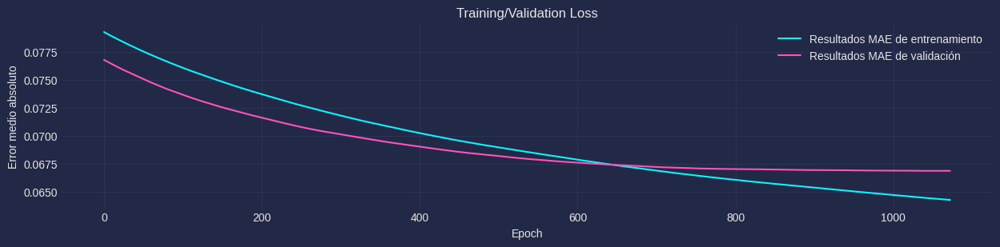

In [ ]:
x = np.arange(0, len(evals_result["train"]["mae"]))

plt.figure(figsize=(15, 3))
sns.lineplot(x=x, y=evals_result["train"]["mae"], legend="brief", label="Resultados MAE de entrenamiento")
sns.lineplot(x=x, y=evals_result["valid"]["mae"], legend="brief", label="Resultados MAE de validación")
plt.xlabel("Epoch")
plt.ylabel("Error medio absoluto")
plt.title("Training/Validation Loss");

## Visualizando predicciones

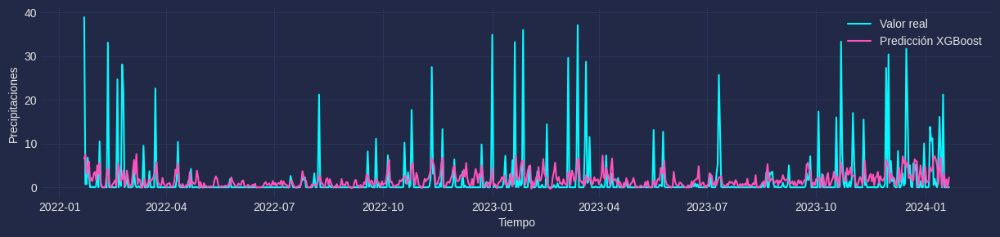

In [ ]:
y_test_predict = model.predict(test_data)
y_test_predict = mms_y.inverse_transform([y_test_predict[:, 0].flatten()])[0, 0:-1]

dates = pd.to_datetime(df_test.index)
plt.figure(figsize=(15, 3))
sns.lineplot(x=dates, y=df_test["precipitation_sum"], legend="brief", label="Valor real")
sns.lineplot(x=dates, y=y_test_predict, legend="brief", label="Predicción XGBoost")
plt.xlabel("Tiempo")
plt.ylabel("Precipitaciones")
plt.legend(loc="upper right");

# PCA Analysis

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99, svd_solver='full', random_state=42)
train_pca = pca.fit_transform(train.drop(["precipitation_sum"], axis=1), train["precipitation_sum"])
valid_pca = pca.transform(valid.drop(["precipitation_sum"], axis=1))
test_pca = pca.transform(test.drop(["precipitation_sum"], axis=1))

pca.explained_variance_ratio_

array([0.48829029, 0.23747726, 0.09972248, 0.0551057 , 0.02861488,
       0.02018085, 0.01441022, 0.01213581, 0.01146401, 0.00830806,
       0.00568625, 0.00409966, 0.00330443, 0.0031205 ])

In [ ]:
X_train_pca = pd.DataFrame(train_pca, columns=pca.get_feature_names_out())
X_valid_pca = pd.DataFrame(valid_pca, columns=pca.get_feature_names_out())
X_test_pca = pd.DataFrame(test_pca, columns=pca.get_feature_names_out())

X_train_pca

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13
0,-91.935125,-20.206568,-13.580378,-13.050044,-1.732056,2.627990,-7.206335,16.865618,0.620822,9.421418,-2.995179,-2.196248,3.080857,0.419898
1,-63.316475,5.189881,-34.903790,-37.307528,4.540507,-7.414316,-15.667297,24.376569,-7.594937,3.528711,-2.317214,-2.601113,4.076871,-4.736167
2,-55.630902,13.602349,-47.518098,-38.967229,7.184914,-9.763212,-4.784491,29.565717,-21.319723,-4.078968,3.385673,-2.311518,-0.284032,1.896955
3,210.882379,18.074713,-59.834916,-28.737662,-24.892746,6.824416,20.080219,15.199407,-17.789842,17.482101,-23.563490,6.085988,-3.341213,-1.236779
4,46.227134,-54.871785,15.540109,-12.936592,-14.259010,-3.226618,-6.401892,18.556019,-21.474872,9.408425,6.860244,-0.319449,1.132762,-1.358625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7322,-80.449316,-13.261430,-24.068997,9.984319,-6.462763,-4.916298,-10.953226,14.317162,0.416982,7.182605,-2.211097,2.025830,3.880459,-5.273104
7323,-66.116662,31.116079,-36.088243,-32.660710,-3.747905,-23.129656,-19.080315,33.979045,-5.649014,-6.912701,-6.745850,2.564601,3.674174,-5.011641
7324,-18.406558,97.308276,-3.458293,1.805556,-41.211253,-12.466130,-2.903520,3.125307,-11.049934,-0.772749,-5.168263,6.094985,0.410316,-6.184118
7325,59.776652,55.687837,65.976812,-13.352074,-39.750777,-1.063831,-2.910583,1.740465,-13.324567,-7.299457,4.193682,-9.090561,7.420326,-4.180177


In [ ]:
mms_X = MinMaxScaler()
mms_y = MinMaxScaler()

train_arr_X = mms_X.fit_transform(X_train_pca).astype("float32")
train_arr_y = mms_y.fit_transform(train[["precipitation_sum"]]).astype("float32")

valid_arr_X = mms_X.fit_transform(X_valid_pca).astype("float32")
valid_arr_y = mms_y.fit_transform(valid[["precipitation_sum"]]).astype("float32")

test_arr_X = mms_X.transform(X_test_pca).astype("float32")
test_arr_y = mms_y.transform(test[["precipitation_sum"]]).astype("float32")

train_arr = np.hstack([train_arr_X, train_arr_y])
valid_arr = np.hstack([valid_arr_X, valid_arr_y])
test_arr = np.hstack([test_arr_X, test_arr_y])

In [ ]:
window_size = lags + 1 #Empieza con cero
target_size = 7
step_size = 1

train_indices = get_indices(train_arr, window_size+target_size, step_size)
valid_indices = get_indices(valid_arr, window_size+target_size, step_size)
test_arr_ = np.vstack([valid_arr[-window_size:], test_arr])
test_indices = get_indices(test_arr_, window_size, step_size)

X_train_, y_train_ = get_X_y(train_arr, train_indices, target_size, window_size)
X_valid_, y_valid_ = get_X_y(valid_arr, valid_indices, target_size, window_size)
X_test_, y_test_ = get_X_y(test_arr_, test_indices, 0, window_size)

train_data = DMatrix(X_train_.reshape(X_train_.shape[0], -1), label=y_train_)
valid_data = DMatrix(X_valid_.reshape(X_valid_.shape[0], -1), label=y_valid_)
test_data = DMatrix(X_test_.reshape(X_test.shape[0], -1))

In [ ]:
evals_result = {
    'train': {'mae': []},
    'eval': {'mae': []}
}

params = {
    "device":"cuda",
    "objective":"reg:squarederror",
    "eval_metric":"mae",
    "random_state":42,
    "learning_rate":0.005,
    "lambda":500,
    "gamma":0.001,
    "max_depth":6,
    "tree_method":"hist",
    "num_parallel_tree":10,
    "min_child_weight":6,
}

rounds = 20

model_pca = xgbtrain(
    params=params,
    dtrain=train_data,
    num_boost_round=4000,
    verbose_eval=5,
    evals=[(train_data, 'train'), (valid_data, 'valid')],
    evals_result=evals_result,
    early_stopping_rounds=rounds
)

[0]	train-mae:0.07921	valid-mae:0.07650
[5]	train-mae:0.07904	valid-mae:0.07636
[10]	train-mae:0.07887	valid-mae:0.07624
[15]	train-mae:0.07870	valid-mae:0.07613
[20]	train-mae:0.07853	valid-mae:0.07602
[25]	train-mae:0.07837	valid-mae:0.07592
[30]	train-mae:0.07820	valid-mae:0.07582
[35]	train-mae:0.07804	valid-mae:0.07573
[40]	train-mae:0.07789	valid-mae:0.07563
[45]	train-mae:0.07774	valid-mae:0.07554
[50]	train-mae:0.07760	valid-mae:0.07544
[55]	train-mae:0.07745	valid-mae:0.07534
[60]	train-mae:0.07731	valid-mae:0.07526
[65]	train-mae:0.07717	valid-mae:0.07517
[70]	train-mae:0.07703	valid-mae:0.07508
[75]	train-mae:0.07690	valid-mae:0.07500
[80]	train-mae:0.07677	valid-mae:0.07491
[85]	train-mae:0.07664	valid-mae:0.07484
[90]	train-mae:0.07651	valid-mae:0.07475
[95]	train-mae:0.07638	valid-mae:0.07466
[100]	train-mae:0.07626	valid-mae:0.07459
[105]	train-mae:0.07613	valid-mae:0.07451
[110]	train-mae:0.07601	valid-mae:0.07444
[115]	train-mae:0.07588	valid-mae:0.07437
[120]	train-ma

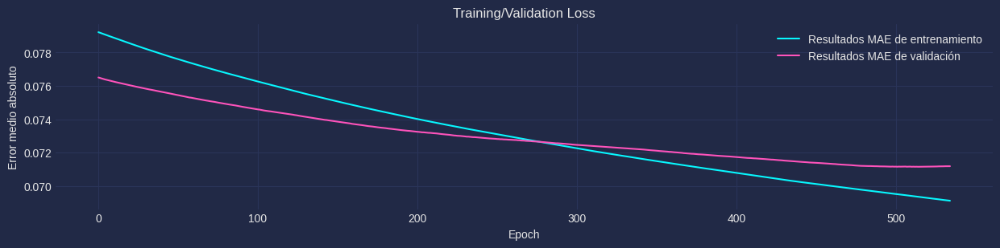

In [ ]:
x = np.arange(0, len(evals_result["train"]["mae"]))

plt.figure(figsize=(15, 3))
sns.lineplot(x=x, y=evals_result["train"]["mae"], legend="brief", label="Resultados MAE de entrenamiento")
sns.lineplot(x=x, y=evals_result["valid"]["mae"], legend="brief", label="Resultados MAE de validación")
plt.xlabel("Epoch")
plt.ylabel("Error medio absoluto")
plt.title("Training/Validation Loss");

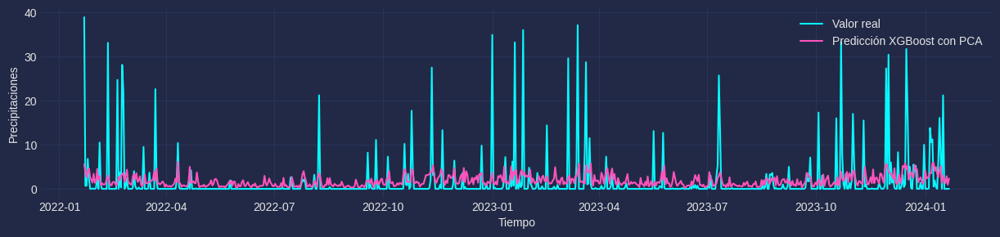

In [ ]:
y_test_predict_pca = model_pca.predict(test_data)
y_test_predict_pca = mms_y.inverse_transform([y_test_predict_pca[:, 0].flatten()])[0, 0:-1]

dates = pd.to_datetime(df_test.index)
plt.figure(figsize=(15, 3))
sns.lineplot(x=dates, y=df_test["precipitation_sum"], legend="brief", label="Valor real")
sns.lineplot(x=dates, y=y_test_predict_pca, legend="brief", label="Predicción XGBoost con PCA")
plt.xlabel("Tiempo")
plt.ylabel("Precipitaciones")
plt.legend(loc="upper right");

# Deep Learning

In [ ]:
import tensorflow as tf
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Bidirectional, BatchNormalization, ConvLSTM2D, Flatten, Reshape, LeakyReLU, TimeDistributed, RepeatVector
from tensorflow.keras.optimizers.legacy import Adam, SGD, RMSprop, Adamax
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.losses import MeanSquaredError, MeanAbsolutePercentageError
from tensorflow.keras.regularizers import L1, L2, L1L2

tf.random.set_seed(42)
np.random.seed(42)

### Creación de tensores

In [ ]:
X_tensor_train = tf.constant(X_train)
y_tensor_train = tf.constant(y_train)

X_tensor_valid = tf.constant(X_valid)
y_tensor_valid = tf.constant(y_valid)

X_tensor_test = tf.constant(X_test)

### Busqueda del mejor learning rate

In [ ]:
model_lstm = Sequential([
       Bidirectional(LSTM(32, return_sequences=True)),
       Bidirectional(LSTM(32, return_sequences=True)),
       Dropout(0.2),

       Bidirectional(LSTM(32, return_sequences=True)),
       Bidirectional(LSTM(32, return_sequences=True)),
       Dropout(0.2),

       LSTM(32),
       Dense(8, activation="relu"),
       Dense(target_size),
    ])
lr_init = 1e-7
learning_rate_sch = LearningRateScheduler(lambda epoch: lr_init * 10**(epoch/20))

model_lstm.compile(loss=MeanSquaredError() ,
                   optimizer=Adam(learning_rate=lr_init),
                   metrics=MeanAbsoluteError())

max_epochs = 100
history = model_lstm.fit(
                         x=X_tensor_train,
                         y=y_tensor_train,
                         batch_size=32,
                         epochs=max_epochs,
                         steps_per_epoch=X_tensor_train.shape[0]//32,
                         callbacks = [learning_rate_sch],
                         verbose=1
                         )

Epoch 1/100
228/228 [==============================] - 23s 15ms/step - loss: 0.0251 - mean_absolute_error: 0.0688 - lr: 1.0000e-07
Epoch 2/100
228/228 [==============================] - 4s 16ms/step - loss: 0.0251 - mean_absolute_error: 0.0683 - lr: 1.1220e-07
Epoch 3/100
228/228 [==============================] - 4s 19ms/step - loss: 0.0250 - mean_absolute_error: 0.0678 - lr: 1.2589e-07
Epoch 4/100
228/228 [==============================] - 4s 17ms/step - loss: 0.0249 - mean_absolute_error: 0.0671 - lr: 1.4125e-07
Epoch 5/100
228/228 [==============================] - 4s 15ms/step - loss: 0.0251 - mean_absolute_error: 0.0669 - lr: 1.5849e-07
Epoch 6/100
228/228 [==============================] - 4s 16ms/step - loss: 0.0247 - mean_absolute_error: 0.0657 - lr: 1.7783e-07
Epoch 7/100
228/228 [==============================] - 4s 19ms/step - loss: 0.0247 - mean_absolute_error: 0.0653 - lr: 1.9953e-07
Epoch 8/100
228/228 [==============================] - 4s 16ms/step - loss: 0.0246 - mean

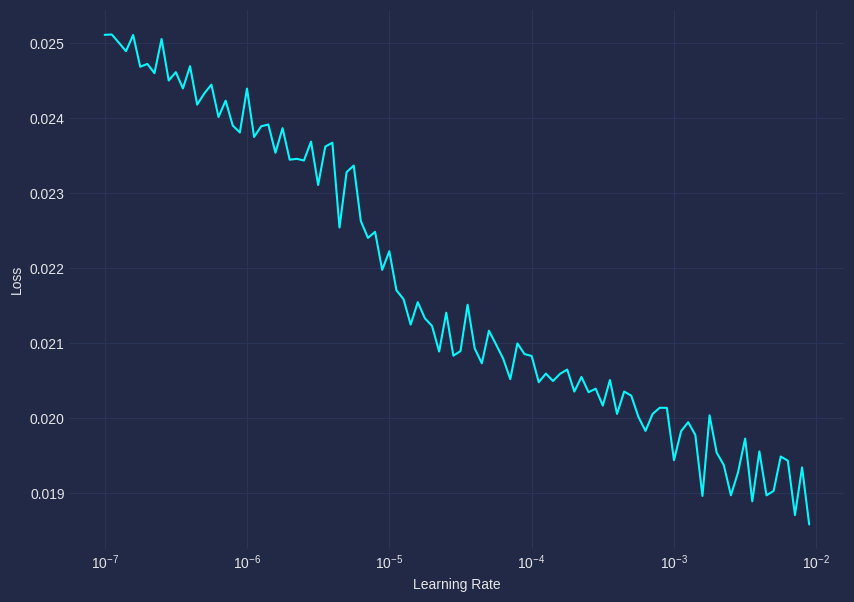

In [ ]:
lrs = lr_init * (10 ** (np.arange(max_epochs)/20))
plt.figure(figsize=(10,7))
plt.semilogx(lrs, history.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss');

En el codo de la curva podemos establecer el learning rate optimo.

### Entrenamiento del modelo

In [ ]:
model_lstm = Sequential([

       Bidirectional(LSTM(32, return_sequences=True)),
       Bidirectional(LSTM(32, return_sequences=True)),
       Dropout(0.2),

       Bidirectional(LSTM(32, return_sequences=True)),
       Bidirectional(LSTM(32,  return_sequences=True)),
       Dropout(0.2),

       LSTM(32),
       Dense(8, activation="relu",),

       Dense(target_size),
    ])

early_stop = EarlyStopping(monitor = 'val_loss', patience = 7)

model_lstm.compile(loss=MeanSquaredError() ,
                   optimizer=Adam(learning_rate=5e-5),
                   metrics=MeanAbsoluteError())

max_epochs = 200
history = model_lstm.fit(
                         x=X_tensor_train,
                         y=y_tensor_train,
                         batch_size=32,
                         epochs=max_epochs,
                         steps_per_epoch=X_tensor_train.shape[0]//32,
                         validation_data=[X_tensor_valid, y_tensor_valid],
                         callbacks = [early_stop],
                         verbose=1
                         )

Epoch 1/200
228/228 [==============================] - 23s 36ms/step - loss: 0.0220 - mean_absolute_error: 0.0694 - val_loss: 0.0195 - val_mean_absolute_error: 0.0667
Epoch 2/200
228/228 [==============================] - 4s 16ms/step - loss: 0.0215 - mean_absolute_error: 0.0720 - val_loss: 0.0192 - val_mean_absolute_error: 0.0677
Epoch 3/200
228/228 [==============================] - 4s 16ms/step - loss: 0.0213 - mean_absolute_error: 0.0738 - val_loss: 0.0191 - val_mean_absolute_error: 0.0685
Epoch 4/200
228/228 [==============================] - 5s 20ms/step - loss: 0.0211 - mean_absolute_error: 0.0748 - val_loss: 0.0191 - val_mean_absolute_error: 0.0693
Epoch 5/200
228/228 [==============================] - 4s 16ms/step - loss: 0.0213 - mean_absolute_error: 0.0762 - val_loss: 0.0190 - val_mean_absolute_error: 0.0706
Epoch 6/200
228/228 [==============================] - 4s 17ms/step - loss: 0.0209 - mean_absolute_error: 0.0757 - val_loss: 0.0190 - val_mean_absolute_error: 0.0715
Epo

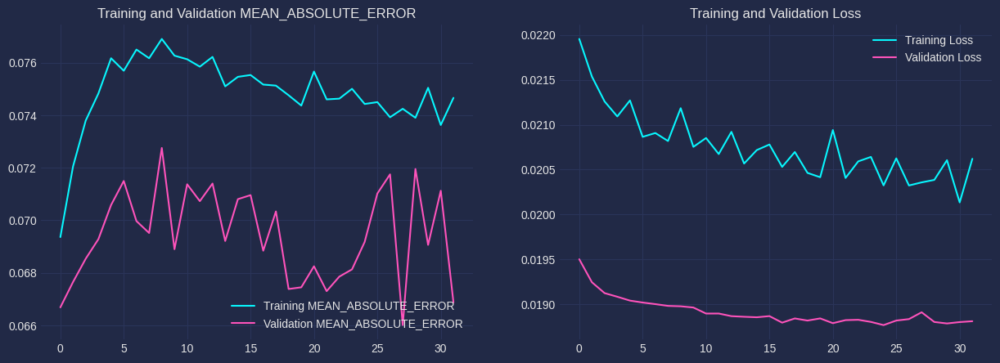

In [ ]:
def plot_history(history, metric="accuracy"):
    acc = history.history[metric]
    val_acc = history.history['val_'+metric]

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(history.history[metric]))

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training '+metric.upper())
    plt.plot(epochs_range, val_acc, label='Validation '+metric.upper())
    plt.legend(loc='lower right')

    plt.title('Training and Validation '+metric.upper())

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

plot_history(history, metric="mean_absolute_error")

In [ ]:
lstm_predictions = model_lstm.predict(X_tensor_test)
lstm_predictions = mms_y.inverse_transform(lstm_predictions)[:-1, 0] #[:, 0]

23/23 [==============================] - 4s 7ms/step


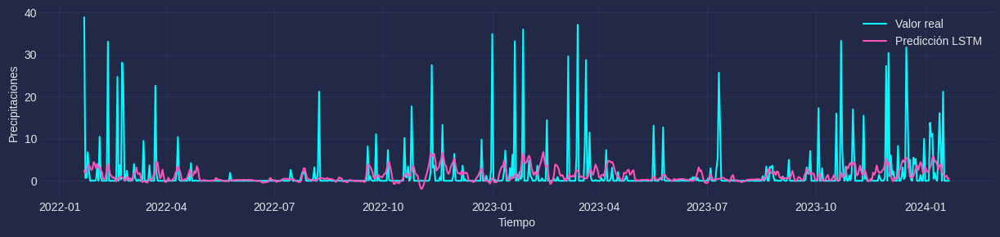

In [ ]:
dates = pd.to_datetime(df_test.index)
plt.figure(figsize=(15, 3))
sns.lineplot(x=dates, y=df_test["precipitation_sum"], legend="brief", label="Valor real")
sns.lineplot(x=dates, y=lstm_predictions, legend="brief", label="Predicción LSTM")
plt.xlabel("Tiempo")
plt.ylabel("Precipitaciones")
plt.legend(loc="upper right");

# Evaluando modelos

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score, max_error

def get_scores(y_true, y_pred):
    return [
            mean_absolute_error(y_true, y_pred),
            mean_squared_error(y_true, y_pred),
            tf.sqrt(mean_squared_error(y_true, y_pred)).numpy(),
            mean_absolute_percentage_error(y_true, y_pred),
            r2_score(y_true, y_pred),
            max_error(y_true, y_pred),
    ]

xgboost_scores = get_scores(df_test["precipitation_sum"], y_test_predict)
xgboost_pca_scores = get_scores(df_test["precipitation_sum"], y_test_predict_pca)
lstm_model_scores = get_scores(df_test["precipitation_sum"], lstm_predictions)

scores = pd.DataFrame(data={"XGBoost": xgboost_scores, "XGBoost con PCA": xgboost_pca_scores, "LSTM model": lstm_model_scores}, index=["MAE", "MSE", "RMSE", "MAPE", "R2 Score", "Max error"])
scores.style.highlight_min(color = 'green', axis = 1).highlight_max(color = 'red', axis = 1)

,XGBoost,XGBoost con PCA,LSTM model
MAE,2.314059,2.509714,2.272128
MSE,24.883223,25.765231,27.640180
RMSE,4.988309,5.075946,5.257393
MAPE,3643845815869612.500000,4528253154137266.000000,3238325254708194.500000
R2 Score,0.148936,0.118770,0.054642
Max error,32.373515,33.325772,36.519246


# Prediccion para los proximos 7 dias con XGBoost

In [ ]:
y_forecast = model.predict(test_data)
y_forecast_after = mms_y.inverse_transform([y_forecast[-3:-1, 0].flatten()])[0]
y_forecast = mms_y.inverse_transform([y_forecast[-1].flatten()])[0]
y_forecast = np.concatenate([y_forecast_after, y_forecast])

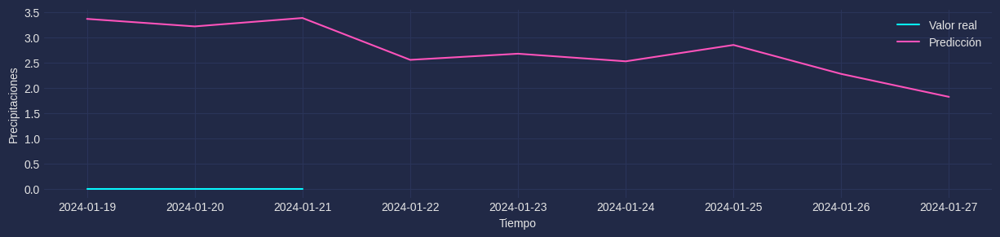

In [ ]:
dates = pd.to_datetime(df_test.index)
dates_forecast = pd.date_range(start=dates[-3], periods=9)
plt.figure(figsize=(15, 3))
sns.lineplot(x=dates[-3:], y=df_test["precipitation_sum"].values[-3:], legend="brief", label="Valor real")
sns.lineplot(x=dates_forecast, y=y_forecast, legend="brief", label="Predicción")
plt.xlabel("Tiempo")
plt.ylabel("Precipitaciones")
plt.legend(loc="upper right");